# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

12

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|dose_training",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|condition",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(8 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['condition', 'dose_training']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v3"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(
GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1726,1569,1419,1730,1419,1541,1454,991
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1559,3552,2180,2832,1726
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 429,392,373,441,371,399,313,244
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 380,916,580,657,429
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:10<1:48:06, 10.83s/it]

Epoch 1/600:   0%|          | 1/600 [00:10<1:48:06, 10.83s/it, v_num=1, total_loss_train=2.72e+3, kl_local_train=29]

Epoch 2/600:   0%|          | 1/600 [00:10<1:48:06, 10.83s/it, v_num=1, total_loss_train=2.72e+3, kl_local_train=29]

Epoch 2/600:   0%|          | 2/600 [00:19<1:33:01,  9.33s/it, v_num=1, total_loss_train=2.72e+3, kl_local_train=29]

Epoch 2/600:   0%|          | 2/600 [00:19<1:33:01,  9.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=51.9]

Epoch 3/600:   0%|          | 2/600 [00:19<1:33:01,  9.33s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=51.9]

Epoch 3/600:   0%|          | 3/600 [00:26<1:25:26,  8.59s/it, v_num=1, total_loss_train=2.23e+3, kl_local_train=51.9]

Epoch 3/600:   0%|          | 3/600 [00:26<1:25:26,  8.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.9] 

Epoch 4/600:   0%|          | 3/600 [00:26<1:25:26,  8.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.9]

Epoch 4/600:   1%|          | 4/600 [00:34<1:22:18,  8.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.9]

Epoch 4/600:   1%|          | 4/600 [00:34<1:22:18,  8.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.9]

Epoch 5/600:   1%|          | 4/600 [00:34<1:22:18,  8.29s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.9]

Epoch 5/600:   1%|          | 5/600 [00:42<1:21:49,  8.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.9]

Epoch 5/600:   1%|          | 5/600 [00:42<1:21:49,  8.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=54.1]

Epoch 6/600:   1%|          | 5/600 [00:43<1:21:49,  8.25s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=54.1]

Epoch 6/600:   1%|          | 6/600 [00:50<1:20:30,  8.13s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=54.1]

Epoch 6/600:   1%|          | 6/600 [00:50<1:20:30,  8.13s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=47.7, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 7/600:   1%|          | 6/600 [00:50<1:20:30,  8.13s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=47.7, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 7/600:   1%|          | 7/600 [00:58<1:18:29,  7.94s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=47.7, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 7/600:   1%|          | 7/600 [00:58<1:18:29,  7.94s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=38.5, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 8/600:   1%|          | 7/600 [00:58<1:18:29,  7.94s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=38.5, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 8/600:   1%|▏         | 8/600 [01:05<1:16:35,  7.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=38.5, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 8/600:   1%|▏         | 8/600 [01:05<1:16:35,  7.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=46.4, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 9/600:   1%|▏         | 8/600 [01:05<1:16:35,  7.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=46.4, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 9/600:   2%|▏         | 9/600 [01:13<1:15:54,  7.71s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=46.4, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 9/600:   2%|▏         | 9/600 [01:13<1:15:54,  7.71s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=44.3, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 10/600:   2%|▏         | 9/600 [01:13<1:15:54,  7.71s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=44.3, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 10/600:   2%|▏         | 10/600 [01:21<1:16:54,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=44.3, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 10/600:   2%|▏         | 10/600 [01:21<1:16:54,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=45.2, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 11/600:   2%|▏         | 10/600 [01:21<1:16:54,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=45.2, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 11/600:   2%|▏         | 11/600 [01:29<1:16:43,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=45.2, metric_mi|dose_training_train=0.0383, metric_mi|condition_train=0.0306]

Epoch 11/600:   2%|▏         | 11/600 [01:29<1:16:43,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=48.2, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142] 

Epoch 12/600:   2%|▏         | 11/600 [01:29<1:16:43,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=48.2, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 12/600:   2%|▏         | 12/600 [01:36<1:15:34,  7.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=48.2, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 12/600:   2%|▏         | 12/600 [01:36<1:15:34,  7.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=54.9, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 13/600:   2%|▏         | 12/600 [01:36<1:15:34,  7.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=54.9, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 13/600:   2%|▏         | 13/600 [01:44<1:14:48,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=54.9, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 13/600:   2%|▏         | 13/600 [01:44<1:14:48,  7.65s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=58.7, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 14/600:   2%|▏         | 13/600 [01:44<1:14:48,  7.65s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=58.7, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 14/600:   2%|▏         | 14/600 [01:51<1:13:56,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=58.7, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 14/600:   2%|▏         | 14/600 [01:51<1:13:56,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 15/600:   2%|▏         | 14/600 [01:51<1:13:56,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 15/600:   2%|▎         | 15/600 [01:59<1:15:57,  7.79s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 15/600:   2%|▎         | 15/600 [01:59<1:15:57,  7.79s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 16/600:   2%|▎         | 15/600 [02:00<1:15:57,  7.79s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 16/600:   3%|▎         | 16/600 [02:08<1:18:08,  8.03s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.142]

Epoch 16/600:   3%|▎         | 16/600 [02:08<1:18:08,  8.03s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192] 

Epoch 17/600:   3%|▎         | 16/600 [02:08<1:18:08,  8.03s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 17/600:   3%|▎         | 17/600 [02:15<1:16:01,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 17/600:   3%|▎         | 17/600 [02:15<1:16:01,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192] 

Epoch 18/600:   3%|▎         | 17/600 [02:15<1:16:01,  7.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 18/600:   3%|▎         | 18/600 [02:23<1:15:07,  7.74s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 18/600:   3%|▎         | 18/600 [02:23<1:15:07,  7.74s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=123, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 19/600:   3%|▎         | 18/600 [02:23<1:15:07,  7.74s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=123, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 19/600:   3%|▎         | 19/600 [02:30<1:13:54,  7.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=123, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 19/600:   3%|▎         | 19/600 [02:30<1:13:54,  7.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 20/600:   3%|▎         | 19/600 [02:30<1:13:54,  7.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 20/600:   3%|▎         | 20/600 [02:38<1:14:32,  7.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 20/600:   3%|▎         | 20/600 [02:38<1:14:32,  7.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=162, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 21/600:   3%|▎         | 20/600 [02:38<1:14:32,  7.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=162, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 21/600:   4%|▎         | 21/600 [02:46<1:15:13,  7.80s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=162, metric_mi|dose_training_train=0.101, metric_mi|condition_train=0.192]

Epoch 21/600:   4%|▎         | 21/600 [02:46<1:15:13,  7.80s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=177, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 22/600:   4%|▎         | 21/600 [02:46<1:15:13,  7.80s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=177, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 22/600:   4%|▎         | 22/600 [02:53<1:13:51,  7.67s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=177, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 22/600:   4%|▎         | 22/600 [02:53<1:13:51,  7.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=199, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 23/600:   4%|▎         | 22/600 [02:53<1:13:51,  7.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=199, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 23/600:   4%|▍         | 23/600 [03:01<1:13:33,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=199, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 23/600:   4%|▍         | 23/600 [03:01<1:13:33,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=217, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 24/600:   4%|▍         | 23/600 [03:01<1:13:33,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=217, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 24/600:   4%|▍         | 24/600 [03:09<1:13:24,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=217, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 24/600:   4%|▍         | 24/600 [03:09<1:13:24,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=228, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 25/600:   4%|▍         | 24/600 [03:09<1:13:24,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=228, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 25/600:   4%|▍         | 25/600 [03:16<1:13:50,  7.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=228, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 25/600:   4%|▍         | 25/600 [03:16<1:13:50,  7.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=230, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 26/600:   4%|▍         | 25/600 [03:17<1:13:50,  7.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=230, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 26/600:   4%|▍         | 26/600 [03:25<1:14:44,  7.81s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=230, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.274]

Epoch 26/600:   4%|▍         | 26/600 [03:25<1:14:44,  7.81s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=242, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 27/600:   4%|▍         | 26/600 [03:25<1:14:44,  7.81s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=242, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 27/600:   4%|▍         | 27/600 [03:32<1:14:16,  7.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=242, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 27/600:   4%|▍         | 27/600 [03:32<1:14:16,  7.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=255, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 28/600:   4%|▍         | 27/600 [03:32<1:14:16,  7.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=255, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 28/600:   5%|▍         | 28/600 [03:40<1:13:02,  7.66s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=255, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 28/600:   5%|▍         | 28/600 [03:40<1:13:02,  7.66s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=261, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 29/600:   5%|▍         | 28/600 [03:40<1:13:02,  7.66s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=261, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 29/600:   5%|▍         | 29/600 [03:47<1:12:47,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=261, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 29/600:   5%|▍         | 29/600 [03:47<1:12:47,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=280, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 30/600:   5%|▍         | 29/600 [03:47<1:12:47,  7.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=280, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 30/600:   5%|▌         | 30/600 [03:55<1:14:00,  7.79s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=280, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 30/600:   5%|▌         | 30/600 [03:55<1:14:00,  7.79s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=280, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 31/600:   5%|▌         | 30/600 [03:56<1:14:00,  7.79s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=280, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 31/600:   5%|▌         | 31/600 [04:03<1:13:45,  7.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=280, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.348]

Epoch 31/600:   5%|▌         | 31/600 [04:03<1:13:45,  7.78s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=295, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 32/600:   5%|▌         | 31/600 [04:03<1:13:45,  7.78s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=295, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 32/600:   5%|▌         | 32/600 [04:11<1:13:19,  7.75s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=295, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 32/600:   5%|▌         | 32/600 [04:11<1:13:19,  7.75s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=290, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 33/600:   5%|▌         | 32/600 [04:11<1:13:19,  7.75s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=290, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 33/600:   6%|▌         | 33/600 [04:18<1:12:50,  7.71s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=290, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 33/600:   6%|▌         | 33/600 [04:18<1:12:50,  7.71s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=286, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 34/600:   6%|▌         | 33/600 [04:18<1:12:50,  7.71s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=286, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 34/600:   6%|▌         | 34/600 [04:26<1:12:06,  7.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=286, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 34/600:   6%|▌         | 34/600 [04:26<1:12:06,  7.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=287, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 35/600:   6%|▌         | 34/600 [04:26<1:12:06,  7.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=287, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 35/600:   6%|▌         | 35/600 [04:34<1:13:10,  7.77s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=287, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 35/600:   6%|▌         | 35/600 [04:34<1:13:10,  7.77s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=282, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 36/600:   6%|▌         | 35/600 [04:34<1:13:10,  7.77s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=282, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 36/600:   6%|▌         | 36/600 [04:42<1:13:37,  7.83s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=282, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.369]

Epoch 36/600:   6%|▌         | 36/600 [04:42<1:13:37,  7.83s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=288, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 37/600:   6%|▌         | 36/600 [04:42<1:13:37,  7.83s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=288, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 37/600:   6%|▌         | 37/600 [04:50<1:12:58,  7.78s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=288, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 37/600:   6%|▌         | 37/600 [04:50<1:12:58,  7.78s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=292, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 38/600:   6%|▌         | 37/600 [04:50<1:12:58,  7.78s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=292, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 38/600:   6%|▋         | 38/600 [04:57<1:12:02,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=292, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 38/600:   6%|▋         | 38/600 [04:57<1:12:02,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=297, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 39/600:   6%|▋         | 38/600 [04:57<1:12:02,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=297, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 39/600:   6%|▋         | 39/600 [05:05<1:11:55,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=297, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 39/600:   6%|▋         | 39/600 [05:05<1:11:55,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=284, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 40/600:   6%|▋         | 39/600 [05:05<1:11:55,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=284, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 40/600:   7%|▋         | 40/600 [05:13<1:13:33,  7.88s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=284, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 40/600:   7%|▋         | 40/600 [05:13<1:13:33,  7.88s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=293, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 41/600:   7%|▋         | 40/600 [05:13<1:13:33,  7.88s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=293, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 41/600:   7%|▋         | 41/600 [05:21<1:13:08,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=293, metric_mi|dose_training_train=0.343, metric_mi|condition_train=0.379]

Epoch 41/600:   7%|▋         | 41/600 [05:21<1:13:08,  7.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=300, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]  

Epoch 42/600:   7%|▋         | 41/600 [05:21<1:13:08,  7.85s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=300, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 42/600:   7%|▋         | 42/600 [05:29<1:12:28,  7.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=300, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 42/600:   7%|▋         | 42/600 [05:29<1:12:28,  7.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=299, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 43/600:   7%|▋         | 42/600 [05:29<1:12:28,  7.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=299, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 43/600:   7%|▋         | 43/600 [05:36<1:11:53,  7.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=299, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 43/600:   7%|▋         | 43/600 [05:36<1:11:53,  7.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=287, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 44/600:   7%|▋         | 43/600 [05:36<1:11:53,  7.74s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=287, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 44/600:   7%|▋         | 44/600 [05:44<1:10:50,  7.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=287, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 44/600:   7%|▋         | 44/600 [05:44<1:10:50,  7.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 45/600:   7%|▋         | 44/600 [05:44<1:10:50,  7.65s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 45/600:   8%|▊         | 45/600 [05:52<1:12:13,  7.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 45/600:   8%|▊         | 45/600 [05:52<1:12:13,  7.81s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=282, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 46/600:   8%|▊         | 45/600 [05:52<1:12:13,  7.81s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=282, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 46/600:   8%|▊         | 46/600 [06:00<1:13:04,  7.91s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=282, metric_mi|dose_training_train=0.36, metric_mi|condition_train=0.393]

Epoch 46/600:   8%|▊         | 46/600 [06:00<1:13:04,  7.91s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 47/600:   8%|▊         | 46/600 [06:00<1:13:04,  7.91s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 47/600:   8%|▊         | 47/600 [06:08<1:12:18,  7.84s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 47/600:   8%|▊         | 47/600 [06:08<1:12:18,  7.84s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=284, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 48/600:   8%|▊         | 47/600 [06:08<1:12:18,  7.84s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=284, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 48/600:   8%|▊         | 48/600 [06:15<1:10:59,  7.72s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=284, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 48/600:   8%|▊         | 48/600 [06:15<1:10:59,  7.72s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=282, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 49/600:   8%|▊         | 48/600 [06:15<1:10:59,  7.72s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=282, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 49/600:   8%|▊         | 49/600 [06:23<1:10:41,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=282, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 49/600:   8%|▊         | 49/600 [06:23<1:10:41,  7.70s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=286, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 50/600:   8%|▊         | 49/600 [06:23<1:10:41,  7.70s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=286, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 50/600:   8%|▊         | 50/600 [06:31<1:11:55,  7.85s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=286, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 50/600:   8%|▊         | 50/600 [06:31<1:11:55,  7.85s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=290, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 51/600:   8%|▊         | 50/600 [06:31<1:11:55,  7.85s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=290, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 51/600:   8%|▊         | 51/600 [06:39<1:11:39,  7.83s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=290, metric_mi|dose_training_train=0.381, metric_mi|condition_train=0.408]

Epoch 51/600:   8%|▊         | 51/600 [06:39<1:11:39,  7.83s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=291, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41] 

Epoch 52/600:   8%|▊         | 51/600 [06:39<1:11:39,  7.83s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=291, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 52/600:   9%|▊         | 52/600 [06:46<1:11:03,  7.78s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=291, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 52/600:   9%|▊         | 52/600 [06:46<1:11:03,  7.78s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=290, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 53/600:   9%|▊         | 52/600 [06:46<1:11:03,  7.78s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=290, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 53/600:   9%|▉         | 53/600 [06:54<1:10:30,  7.73s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=290, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 53/600:   9%|▉         | 53/600 [06:54<1:10:30,  7.73s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=291, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 54/600:   9%|▉         | 53/600 [06:54<1:10:30,  7.73s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=291, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 54/600:   9%|▉         | 54/600 [07:01<1:09:28,  7.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=291, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 54/600:   9%|▉         | 54/600 [07:01<1:09:28,  7.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=287, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 55/600:   9%|▉         | 54/600 [07:01<1:09:28,  7.63s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=287, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 55/600:   9%|▉         | 55/600 [07:10<1:10:53,  7.80s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=287, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 55/600:   9%|▉         | 55/600 [07:10<1:10:53,  7.80s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=280, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 56/600:   9%|▉         | 55/600 [07:10<1:10:53,  7.80s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=280, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 56/600:   9%|▉         | 56/600 [07:18<1:11:38,  7.90s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=280, metric_mi|dose_training_train=0.394, metric_mi|condition_train=0.41]

Epoch 56/600:   9%|▉         | 56/600 [07:18<1:11:38,  7.90s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=278, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 57/600:   9%|▉         | 56/600 [07:18<1:11:38,  7.90s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=278, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 57/600:  10%|▉         | 57/600 [07:25<1:10:22,  7.78s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=278, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 57/600:  10%|▉         | 57/600 [07:25<1:10:22,  7.78s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=270, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 58/600:  10%|▉         | 57/600 [07:25<1:10:22,  7.78s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=270, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 58/600:  10%|▉         | 58/600 [07:33<1:09:53,  7.74s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=270, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 58/600:  10%|▉         | 58/600 [07:33<1:09:53,  7.74s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=265, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 59/600:  10%|▉         | 58/600 [07:33<1:09:53,  7.74s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=265, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 59/600:  10%|▉         | 59/600 [07:40<1:09:26,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=265, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 59/600:  10%|▉         | 59/600 [07:40<1:09:26,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 60/600:  10%|▉         | 59/600 [07:40<1:09:26,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 60/600:  10%|█         | 60/600 [07:49<1:10:20,  7.82s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 60/600:  10%|█         | 60/600 [07:49<1:10:20,  7.82s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=262, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 61/600:  10%|█         | 60/600 [07:49<1:10:20,  7.82s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=262, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 61/600:  10%|█         | 61/600 [07:56<1:10:25,  7.84s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=262, metric_mi|dose_training_train=0.399, metric_mi|condition_train=0.405]

Epoch 61/600:  10%|█         | 61/600 [07:56<1:10:25,  7.84s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=256, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]  

Epoch 62/600:  10%|█         | 61/600 [07:56<1:10:25,  7.84s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=256, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 62/600:  10%|█         | 62/600 [08:04<1:09:54,  7.80s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=256, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 62/600:  10%|█         | 62/600 [08:04<1:09:54,  7.80s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=244, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 63/600:  10%|█         | 62/600 [08:04<1:09:54,  7.80s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=244, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 63/600:  10%|█         | 63/600 [08:12<1:09:27,  7.76s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=244, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 63/600:  10%|█         | 63/600 [08:12<1:09:27,  7.76s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=237, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 64/600:  10%|█         | 63/600 [08:12<1:09:27,  7.76s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=237, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 64/600:  11%|█         | 64/600 [08:19<1:08:49,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=237, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 64/600:  11%|█         | 64/600 [08:19<1:08:49,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=244, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 65/600:  11%|█         | 64/600 [08:19<1:08:49,  7.70s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=244, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 65/600:  11%|█         | 65/600 [08:27<1:09:17,  7.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=244, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 65/600:  11%|█         | 65/600 [08:27<1:09:17,  7.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=236, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 66/600:  11%|█         | 65/600 [08:28<1:09:17,  7.77s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=236, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 66/600:  11%|█         | 66/600 [08:35<1:09:42,  7.83s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=236, metric_mi|dose_training_train=0.4, metric_mi|condition_train=0.404]

Epoch 66/600:  11%|█         | 66/600 [08:35<1:09:42,  7.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=230, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 67/600:  11%|█         | 66/600 [08:35<1:09:42,  7.83s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=230, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 67/600:  11%|█         | 67/600 [08:43<1:09:02,  7.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=230, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 67/600:  11%|█         | 67/600 [08:43<1:09:02,  7.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=228, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 68/600:  11%|█         | 67/600 [08:43<1:09:02,  7.77s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=228, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 68/600:  11%|█▏        | 68/600 [08:50<1:08:18,  7.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=228, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 68/600:  11%|█▏        | 68/600 [08:50<1:08:18,  7.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=227, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 69/600:  11%|█▏        | 68/600 [08:50<1:08:18,  7.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=227, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 69/600:  12%|█▏        | 69/600 [08:58<1:08:08,  7.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=227, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 69/600:  12%|█▏        | 69/600 [08:58<1:08:08,  7.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=220, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 70/600:  12%|█▏        | 69/600 [08:58<1:08:08,  7.70s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=220, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 70/600:  12%|█▏        | 70/600 [09:06<1:08:53,  7.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=220, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 70/600:  12%|█▏        | 70/600 [09:06<1:08:53,  7.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=214, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 71/600:  12%|█▏        | 70/600 [09:07<1:08:53,  7.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=214, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 71/600:  12%|█▏        | 71/600 [09:14<1:09:40,  7.90s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=214, metric_mi|dose_training_train=0.389, metric_mi|condition_train=0.389]

Epoch 71/600:  12%|█▏        | 71/600 [09:14<1:09:40,  7.90s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=215, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369] 

Epoch 72/600:  12%|█▏        | 71/600 [09:14<1:09:40,  7.90s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=215, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 72/600:  12%|█▏        | 72/600 [09:22<1:08:41,  7.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=215, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 72/600:  12%|█▏        | 72/600 [09:22<1:08:41,  7.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=208, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 73/600:  12%|█▏        | 72/600 [09:22<1:08:41,  7.81s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=208, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 73/600:  12%|█▏        | 73/600 [09:30<1:08:24,  7.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=208, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 73/600:  12%|█▏        | 73/600 [09:30<1:08:24,  7.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=206, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 74/600:  12%|█▏        | 73/600 [09:30<1:08:24,  7.79s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=206, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 74/600:  12%|█▏        | 74/600 [09:37<1:08:24,  7.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=206, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 74/600:  12%|█▏        | 74/600 [09:37<1:08:24,  7.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=206, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 75/600:  12%|█▏        | 74/600 [09:38<1:08:24,  7.80s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=206, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 75/600:  12%|█▎        | 75/600 [09:46<1:09:16,  7.92s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=206, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 75/600:  12%|█▎        | 75/600 [09:46<1:09:16,  7.92s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 76/600:  12%|█▎        | 75/600 [09:46<1:09:16,  7.92s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 76/600:  13%|█▎        | 76/600 [09:54<1:09:07,  7.91s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.38, metric_mi|condition_train=0.369]

Epoch 76/600:  13%|█▎        | 76/600 [09:54<1:09:07,  7.91s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=209, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 77/600:  13%|█▎        | 76/600 [09:54<1:09:07,  7.91s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=209, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 77/600:  13%|█▎        | 77/600 [10:01<1:08:38,  7.88s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=209, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 77/600:  13%|█▎        | 77/600 [10:01<1:08:38,  7.88s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=203, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 78/600:  13%|█▎        | 77/600 [10:01<1:08:38,  7.88s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=203, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 78/600:  13%|█▎        | 78/600 [10:09<1:08:22,  7.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=203, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 78/600:  13%|█▎        | 78/600 [10:09<1:08:22,  7.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=202, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 79/600:  13%|█▎        | 78/600 [10:09<1:08:22,  7.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=202, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 79/600:  13%|█▎        | 79/600 [10:17<1:07:35,  7.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=202, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 79/600:  13%|█▎        | 79/600 [10:17<1:07:35,  7.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 80/600:  13%|█▎        | 79/600 [10:17<1:07:35,  7.78s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 80/600:  13%|█▎        | 80/600 [10:25<1:08:05,  7.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 80/600:  13%|█▎        | 80/600 [10:25<1:08:05,  7.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=194, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 81/600:  13%|█▎        | 80/600 [10:25<1:08:05,  7.86s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=194, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 81/600:  14%|█▎        | 81/600 [10:33<1:08:25,  7.91s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=194, metric_mi|dose_training_train=0.375, metric_mi|condition_train=0.377]

Epoch 81/600:  14%|█▎        | 81/600 [10:33<1:08:25,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=193, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 82/600:  14%|█▎        | 81/600 [10:33<1:08:25,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=193, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 82/600:  14%|█▎        | 82/600 [10:41<1:07:51,  7.86s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=193, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 82/600:  14%|█▎        | 82/600 [10:41<1:07:51,  7.86s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=194, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 83/600:  14%|█▎        | 82/600 [10:41<1:07:51,  7.86s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=194, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 83/600:  14%|█▍        | 83/600 [10:48<1:07:23,  7.82s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=194, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 83/600:  14%|█▍        | 83/600 [10:48<1:07:23,  7.82s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=190, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 84/600:  14%|█▍        | 83/600 [10:48<1:07:23,  7.82s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=190, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 84/600:  14%|█▍        | 84/600 [10:56<1:06:27,  7.73s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=190, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 84/600:  14%|█▍        | 84/600 [10:56<1:06:27,  7.73s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=188, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 85/600:  14%|█▍        | 84/600 [10:56<1:06:27,  7.73s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=188, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 85/600:  14%|█▍        | 85/600 [11:04<1:07:21,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=188, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 85/600:  14%|█▍        | 85/600 [11:04<1:07:21,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=186, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 86/600:  14%|█▍        | 85/600 [11:04<1:07:21,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=186, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 86/600:  14%|█▍        | 86/600 [11:12<1:07:52,  7.92s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=186, metric_mi|dose_training_train=0.374, metric_mi|condition_train=0.382]

Epoch 86/600:  14%|█▍        | 86/600 [11:12<1:07:52,  7.92s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=181, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 87/600:  14%|█▍        | 86/600 [11:12<1:07:52,  7.92s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=181, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 87/600:  14%|█▍        | 87/600 [11:20<1:06:42,  7.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=181, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 87/600:  14%|█▍        | 87/600 [11:20<1:06:42,  7.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=180, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 88/600:  14%|█▍        | 87/600 [11:20<1:06:42,  7.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=180, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 88/600:  15%|█▍        | 88/600 [11:27<1:06:30,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=180, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 88/600:  15%|█▍        | 88/600 [11:27<1:06:30,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=183, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 89/600:  15%|█▍        | 88/600 [11:27<1:06:30,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=183, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 89/600:  15%|█▍        | 89/600 [11:35<1:06:27,  7.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=183, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 89/600:  15%|█▍        | 89/600 [11:35<1:06:27,  7.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=175, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 90/600:  15%|█▍        | 89/600 [11:35<1:06:27,  7.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=175, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 90/600:  15%|█▌        | 90/600 [11:43<1:07:01,  7.89s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=175, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 90/600:  15%|█▌        | 90/600 [11:43<1:07:01,  7.89s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=174, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 91/600:  15%|█▌        | 90/600 [11:44<1:07:01,  7.89s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=174, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 91/600:  15%|█▌        | 91/600 [11:51<1:07:04,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=174, metric_mi|dose_training_train=0.361, metric_mi|condition_train=0.379]

Epoch 91/600:  15%|█▌        | 91/600 [11:51<1:07:04,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=176, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37] 

Epoch 92/600:  15%|█▌        | 91/600 [11:51<1:07:04,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=176, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 92/600:  15%|█▌        | 92/600 [11:59<1:06:40,  7.87s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=176, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 92/600:  15%|█▌        | 92/600 [11:59<1:06:40,  7.87s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 93/600:  15%|█▌        | 92/600 [11:59<1:06:40,  7.87s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 93/600:  16%|█▌        | 93/600 [12:07<1:06:18,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 93/600:  16%|█▌        | 93/600 [12:07<1:06:18,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=164, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 94/600:  16%|█▌        | 93/600 [12:07<1:06:18,  7.85s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=164, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 94/600:  16%|█▌        | 94/600 [12:14<1:05:41,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=164, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 94/600:  16%|█▌        | 94/600 [12:14<1:05:41,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=162, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 95/600:  16%|█▌        | 94/600 [12:14<1:05:41,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=162, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 95/600:  16%|█▌        | 95/600 [12:22<1:06:01,  7.84s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=162, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 95/600:  16%|█▌        | 95/600 [12:22<1:06:01,  7.84s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=161, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 96/600:  16%|█▌        | 95/600 [12:23<1:06:01,  7.84s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=161, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 96/600:  16%|█▌        | 96/600 [12:31<1:06:56,  7.97s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=161, metric_mi|dose_training_train=0.358, metric_mi|condition_train=0.37]

Epoch 96/600:  16%|█▌        | 96/600 [12:31<1:06:56,  7.97s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=158, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 97/600:  16%|█▌        | 96/600 [12:31<1:06:56,  7.97s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=158, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 97/600:  16%|█▌        | 97/600 [12:38<1:06:18,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=158, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 97/600:  16%|█▌        | 97/600 [12:38<1:06:18,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=157, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 98/600:  16%|█▌        | 97/600 [12:38<1:06:18,  7.91s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=157, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 98/600:  16%|█▋        | 98/600 [12:46<1:05:11,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=157, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 98/600:  16%|█▋        | 98/600 [12:46<1:05:11,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=157, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 99/600:  16%|█▋        | 98/600 [12:46<1:05:11,  7.79s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=157, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 99/600:  16%|█▋        | 99/600 [12:53<1:04:11,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=157, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 99/600:  16%|█▋        | 99/600 [12:53<1:04:11,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=155, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 100/600:  16%|█▋        | 99/600 [12:53<1:04:11,  7.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=155, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 100/600:  17%|█▋        | 100/600 [13:01<1:04:21,  7.72s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=155, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 100/600:  17%|█▋        | 100/600 [13:01<1:04:21,  7.72s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 101/600:  17%|█▋        | 100/600 [13:02<1:04:21,  7.72s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 101/600:  17%|█▋        | 101/600 [13:09<1:04:31,  7.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.339, metric_mi|condition_train=0.371]

Epoch 101/600:  17%|█▋        | 101/600 [13:09<1:04:31,  7.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 102/600:  17%|█▋        | 101/600 [13:09<1:04:31,  7.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 102/600:  17%|█▋        | 102/600 [13:16<1:03:28,  7.65s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 102/600:  17%|█▋        | 102/600 [13:16<1:03:28,  7.65s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 103/600:  17%|█▋        | 102/600 [13:16<1:03:28,  7.65s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 103/600:  17%|█▋        | 103/600 [13:24<1:02:44,  7.57s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 103/600:  17%|█▋        | 103/600 [13:24<1:02:44,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=155, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 104/600:  17%|█▋        | 103/600 [13:24<1:02:44,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=155, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 104/600:  17%|█▋        | 104/600 [13:31<1:02:19,  7.54s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=155, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 104/600:  17%|█▋        | 104/600 [13:31<1:02:19,  7.54s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=153, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 105/600:  17%|█▋        | 104/600 [13:31<1:02:19,  7.54s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=153, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 105/600:  18%|█▊        | 105/600 [13:39<1:02:39,  7.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=153, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 105/600:  18%|█▊        | 105/600 [13:39<1:02:39,  7.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=152, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 106/600:  18%|█▊        | 105/600 [13:39<1:02:39,  7.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=152, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 106/600:  18%|█▊        | 106/600 [13:47<1:03:11,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=152, metric_mi|dose_training_train=0.346, metric_mi|condition_train=0.382]

Epoch 106/600:  18%|█▊        | 106/600 [13:47<1:03:11,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=151, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 107/600:  18%|█▊        | 106/600 [13:47<1:03:11,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=151, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 107/600:  18%|█▊        | 107/600 [13:54<1:02:48,  7.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=151, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 107/600:  18%|█▊        | 107/600 [13:54<1:02:48,  7.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=149, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 108/600:  18%|█▊        | 107/600 [13:54<1:02:48,  7.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=149, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 108/600:  18%|█▊        | 108/600 [14:02<1:02:06,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=149, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 108/600:  18%|█▊        | 108/600 [14:02<1:02:06,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 109/600:  18%|█▊        | 108/600 [14:02<1:02:06,  7.57s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 109/600:  18%|█▊        | 109/600 [14:09<1:01:40,  7.54s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 109/600:  18%|█▊        | 109/600 [14:09<1:01:40,  7.54s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 110/600:  18%|█▊        | 109/600 [14:09<1:01:40,  7.54s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 110/600:  18%|█▊        | 110/600 [14:17<1:02:08,  7.61s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 110/600:  18%|█▊        | 110/600 [14:17<1:02:08,  7.61s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=147, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 111/600:  18%|█▊        | 110/600 [14:17<1:02:08,  7.61s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=147, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 111/600:  18%|█▊        | 111/600 [14:25<1:02:34,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=147, metric_mi|dose_training_train=0.348, metric_mi|condition_train=0.379]

Epoch 111/600:  18%|█▊        | 111/600 [14:25<1:02:34,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 112/600:  18%|█▊        | 111/600 [14:25<1:02:34,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 112/600:  19%|█▊        | 112/600 [14:32<1:01:42,  7.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 112/600:  19%|█▊        | 112/600 [14:32<1:01:42,  7.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 113/600:  19%|█▊        | 112/600 [14:32<1:01:42,  7.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 113/600:  19%|█▉        | 113/600 [14:40<1:01:39,  7.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 113/600:  19%|█▉        | 113/600 [14:40<1:01:39,  7.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 114/600:  19%|█▉        | 113/600 [14:40<1:01:39,  7.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 114/600:  19%|█▉        | 114/600 [14:47<1:01:08,  7.55s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 114/600:  19%|█▉        | 114/600 [14:47<1:01:08,  7.55s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 115/600:  19%|█▉        | 114/600 [14:47<1:01:08,  7.55s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 115/600:  19%|█▉        | 115/600 [14:56<1:02:23,  7.72s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=148, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 115/600:  19%|█▉        | 115/600 [14:56<1:02:23,  7.72s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=145, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 116/600:  19%|█▉        | 115/600 [14:56<1:02:23,  7.72s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=145, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 116/600:  19%|█▉        | 116/600 [15:04<1:03:02,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=145, metric_mi|dose_training_train=0.341, metric_mi|condition_train=0.362]

Epoch 116/600:  19%|█▉        | 116/600 [15:04<1:03:02,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 117/600:  19%|█▉        | 116/600 [15:04<1:03:02,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 117/600:  20%|█▉        | 117/600 [15:11<1:02:10,  7.72s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 117/600:  20%|█▉        | 117/600 [15:11<1:02:10,  7.72s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 118/600:  20%|█▉        | 117/600 [15:11<1:02:10,  7.72s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 118/600:  20%|█▉        | 118/600 [15:19<1:01:47,  7.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=146, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 118/600:  20%|█▉        | 118/600 [15:19<1:01:47,  7.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 119/600:  20%|█▉        | 118/600 [15:19<1:01:47,  7.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 119/600:  20%|█▉        | 119/600 [15:26<1:01:33,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 119/600:  20%|█▉        | 119/600 [15:26<1:01:33,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=143, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 120/600:  20%|█▉        | 119/600 [15:26<1:01:33,  7.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=143, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 120/600:  20%|██        | 120/600 [15:34<1:02:17,  7.79s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=143, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 120/600:  20%|██        | 120/600 [15:34<1:02:17,  7.79s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=142, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 121/600:  20%|██        | 120/600 [15:35<1:02:17,  7.79s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=142, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 121/600:  20%|██        | 121/600 [15:42<1:02:33,  7.84s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=142, metric_mi|dose_training_train=0.337, metric_mi|condition_train=0.361]

Epoch 121/600:  20%|██        | 121/600 [15:42<1:02:33,  7.84s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 122/600:  20%|██        | 121/600 [15:42<1:02:33,  7.84s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 122/600:  20%|██        | 122/600 [15:50<1:02:30,  7.85s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 122/600:  20%|██        | 122/600 [15:50<1:02:30,  7.85s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 123/600:  20%|██        | 122/600 [15:50<1:02:30,  7.85s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 123/600:  20%|██        | 123/600 [15:58<1:02:10,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=144, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 123/600:  20%|██        | 123/600 [15:58<1:02:10,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=142, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 124/600:  20%|██        | 123/600 [15:58<1:02:10,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=142, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 124/600:  21%|██        | 124/600 [16:06<1:01:27,  7.75s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=142, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 124/600:  21%|██        | 124/600 [16:06<1:01:27,  7.75s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 125/600:  21%|██        | 124/600 [16:06<1:01:27,  7.75s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 125/600:  21%|██        | 125/600 [16:14<1:02:09,  7.85s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 125/600:  21%|██        | 125/600 [16:14<1:02:09,  7.85s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 126/600:  21%|██        | 125/600 [16:14<1:02:09,  7.85s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 126/600:  21%|██        | 126/600 [16:22<1:02:56,  7.97s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.375]

Epoch 126/600:  21%|██        | 126/600 [16:22<1:02:56,  7.97s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 127/600:  21%|██        | 126/600 [16:22<1:02:56,  7.97s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 127/600:  21%|██        | 127/600 [16:30<1:02:37,  7.94s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=140, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 127/600:  21%|██        | 127/600 [16:30<1:02:37,  7.94s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=139, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 128/600:  21%|██        | 127/600 [16:30<1:02:37,  7.94s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=139, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 128/600:  21%|██▏       | 128/600 [16:37<1:01:32,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=139, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 128/600:  21%|██▏       | 128/600 [16:37<1:01:32,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 129/600:  21%|██▏       | 128/600 [16:37<1:01:32,  7.82s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 129/600:  22%|██▏       | 129/600 [16:45<1:01:20,  7.81s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 129/600:  22%|██▏       | 129/600 [16:45<1:01:20,  7.81s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 130/600:  22%|██▏       | 129/600 [16:45<1:01:20,  7.81s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 130/600:  22%|██▏       | 130/600 [16:53<1:02:05,  7.93s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 130/600:  22%|██▏       | 130/600 [16:53<1:02:05,  7.93s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 131/600:  22%|██▏       | 130/600 [16:54<1:02:05,  7.93s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 131/600:  22%|██▏       | 131/600 [17:01<1:02:39,  8.02s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=138, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.375]

Epoch 131/600:  22%|██▏       | 131/600 [17:01<1:02:39,  8.02s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 132/600:  22%|██▏       | 131/600 [17:02<1:02:39,  8.02s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 132/600:  22%|██▏       | 132/600 [17:09<1:01:34,  7.89s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 132/600:  22%|██▏       | 132/600 [17:09<1:01:34,  7.89s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=136, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 133/600:  22%|██▏       | 132/600 [17:09<1:01:34,  7.89s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=136, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 133/600:  22%|██▏       | 133/600 [17:17<1:01:17,  7.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=136, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 133/600:  22%|██▏       | 133/600 [17:17<1:01:17,  7.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 134/600:  22%|██▏       | 133/600 [17:17<1:01:17,  7.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 134/600:  22%|██▏       | 134/600 [17:25<1:01:06,  7.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 134/600:  22%|██▏       | 134/600 [17:25<1:01:06,  7.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 135/600:  22%|██▏       | 134/600 [17:25<1:01:06,  7.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 135/600:  22%|██▎       | 135/600 [17:33<1:01:44,  7.97s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=137, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 135/600:  22%|██▎       | 135/600 [17:33<1:01:44,  7.97s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=135, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 136/600:  22%|██▎       | 135/600 [17:33<1:01:44,  7.97s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=135, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 136/600:  23%|██▎       | 136/600 [17:41<1:02:16,  8.05s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=135, metric_mi|dose_training_train=0.344, metric_mi|condition_train=0.369]

Epoch 136/600:  23%|██▎       | 136/600 [17:41<1:02:16,  8.05s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=134, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 137/600:  23%|██▎       | 136/600 [17:41<1:02:16,  8.05s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=134, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 137/600:  23%|██▎       | 137/600 [17:49<1:01:22,  7.95s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=134, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 137/600:  23%|██▎       | 137/600 [17:49<1:01:22,  7.95s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=132, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 138/600:  23%|██▎       | 137/600 [17:49<1:01:22,  7.95s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=132, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 138/600:  23%|██▎       | 138/600 [17:57<1:01:18,  7.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=132, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 138/600:  23%|██▎       | 138/600 [17:57<1:01:18,  7.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=135, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 139/600:  23%|██▎       | 138/600 [17:57<1:01:18,  7.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=135, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 139/600:  23%|██▎       | 139/600 [18:05<1:01:08,  7.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=135, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 139/600:  23%|██▎       | 139/600 [18:05<1:01:08,  7.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=133, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 140/600:  23%|██▎       | 139/600 [18:05<1:01:08,  7.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=133, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 140/600:  23%|██▎       | 140/600 [18:13<1:01:40,  8.04s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=133, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 140/600:  23%|██▎       | 140/600 [18:13<1:01:40,  8.04s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=132, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 141/600:  23%|██▎       | 140/600 [18:13<1:01:40,  8.04s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=132, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 141/600:  24%|██▎       | 141/600 [18:21<1:02:10,  8.13s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=132, metric_mi|dose_training_train=0.336, metric_mi|condition_train=0.356]

Epoch 141/600:  24%|██▎       | 141/600 [18:21<1:02:10,  8.13s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=133, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 142/600:  24%|██▎       | 141/600 [18:21<1:02:10,  8.13s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=133, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 142/600:  24%|██▎       | 142/600 [18:29<1:00:55,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=133, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 142/600:  24%|██▎       | 142/600 [18:29<1:00:55,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=134, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 143/600:  24%|██▎       | 142/600 [18:29<1:00:55,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=134, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 143/600:  24%|██▍       | 143/600 [18:37<1:00:34,  7.95s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=134, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 143/600:  24%|██▍       | 143/600 [18:37<1:00:34,  7.95s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=131, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 144/600:  24%|██▍       | 143/600 [18:37<1:00:34,  7.95s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=131, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 144/600:  24%|██▍       | 144/600 [18:45<1:00:23,  7.95s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=131, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 144/600:  24%|██▍       | 144/600 [18:45<1:00:23,  7.95s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=132, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 145/600:  24%|██▍       | 144/600 [18:45<1:00:23,  7.95s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=132, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 145/600:  24%|██▍       | 145/600 [18:53<1:00:27,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=132, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 145/600:  24%|██▍       | 145/600 [18:53<1:00:27,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 146/600:  24%|██▍       | 145/600 [18:53<1:00:27,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 146/600:  24%|██▍       | 146/600 [19:01<1:01:16,  8.10s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.333, metric_mi|condition_train=0.349]

Epoch 146/600:  24%|██▍       | 146/600 [19:01<1:01:16,  8.10s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 147/600:  24%|██▍       | 146/600 [19:01<1:01:16,  8.10s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 147/600:  24%|██▍       | 147/600 [19:09<1:00:32,  8.02s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 147/600:  24%|██▍       | 147/600 [19:09<1:00:32,  8.02s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 148/600:  24%|██▍       | 147/600 [19:09<1:00:32,  8.02s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 148/600:  25%|██▍       | 148/600 [19:17<1:00:02,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 148/600:  25%|██▍       | 148/600 [19:17<1:00:02,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 149/600:  25%|██▍       | 148/600 [19:17<1:00:02,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 149/600:  25%|██▍       | 149/600 [19:25<59:05,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]  

Epoch 149/600:  25%|██▍       | 149/600 [19:25<59:05,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=131, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 150/600:  25%|██▍       | 149/600 [19:25<59:05,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=131, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 150/600:  25%|██▌       | 150/600 [19:33<1:00:10,  8.02s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=131, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 150/600:  25%|██▌       | 150/600 [19:33<1:00:10,  8.02s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 151/600:  25%|██▌       | 150/600 [19:33<1:00:10,  8.02s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 151/600:  25%|██▌       | 151/600 [19:41<1:00:42,  8.11s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=130, metric_mi|dose_training_train=0.331, metric_mi|condition_train=0.357]

Epoch 151/600:  25%|██▌       | 151/600 [19:41<1:00:42,  8.11s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 152/600:  25%|██▌       | 151/600 [19:41<1:00:42,  8.11s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 152/600:  25%|██▌       | 152/600 [19:49<59:58,  8.03s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]  

Epoch 152/600:  25%|██▌       | 152/600 [19:49<59:58,  8.03s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=128, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 153/600:  25%|██▌       | 152/600 [19:49<59:58,  8.03s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=128, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 153/600:  26%|██▌       | 153/600 [19:57<58:57,  7.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=128, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 153/600:  26%|██▌       | 153/600 [19:57<58:57,  7.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 154/600:  26%|██▌       | 153/600 [19:57<58:57,  7.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 154/600:  26%|██▌       | 154/600 [20:05<58:49,  7.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 154/600:  26%|██▌       | 154/600 [20:05<58:49,  7.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=128, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 155/600:  26%|██▌       | 154/600 [20:05<58:49,  7.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=128, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 155/600:  26%|██▌       | 155/600 [20:13<59:11,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=128, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 155/600:  26%|██▌       | 155/600 [20:13<59:11,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=127, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 156/600:  26%|██▌       | 155/600 [20:13<59:11,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=127, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 156/600:  26%|██▌       | 156/600 [20:21<59:52,  8.09s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=127, metric_mi|dose_training_train=0.327, metric_mi|condition_train=0.359]

Epoch 156/600:  26%|██▌       | 156/600 [20:21<59:52,  8.09s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349] 

Epoch 157/600:  26%|██▌       | 156/600 [20:21<59:52,  8.09s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 157/600:  26%|██▌       | 157/600 [20:29<58:50,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=129, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 157/600:  26%|██▌       | 157/600 [20:29<58:50,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 158/600:  26%|██▌       | 157/600 [20:29<58:50,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 158/600:  26%|██▋       | 158/600 [20:37<58:40,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 158/600:  26%|██▋       | 158/600 [20:37<58:40,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 159/600:  26%|██▋       | 158/600 [20:37<58:40,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 159/600:  26%|██▋       | 159/600 [20:45<58:33,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 159/600:  26%|██▋       | 159/600 [20:45<58:33,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=127, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 160/600:  26%|██▋       | 159/600 [20:45<58:33,  7.97s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=127, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 160/600:  27%|██▋       | 160/600 [20:53<59:07,  8.06s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=127, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 160/600:  27%|██▋       | 160/600 [20:53<59:07,  8.06s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 161/600:  27%|██▋       | 160/600 [20:54<59:07,  8.06s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 161/600:  27%|██▋       | 161/600 [21:01<58:56,  8.06s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=126, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.349]

Epoch 161/600:  27%|██▋       | 161/600 [21:01<58:56,  8.06s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 162/600:  27%|██▋       | 161/600 [21:01<58:56,  8.06s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 162/600:  27%|██▋       | 162/600 [21:09<58:39,  8.04s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 162/600:  27%|██▋       | 162/600 [21:09<58:39,  8.04s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 163/600:  27%|██▋       | 162/600 [21:09<58:39,  8.04s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 163/600:  27%|██▋       | 163/600 [21:17<58:17,  8.00s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 163/600:  27%|██▋       | 163/600 [21:17<58:17,  8.00s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 164/600:  27%|██▋       | 163/600 [21:17<58:17,  8.00s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 164/600:  27%|██▋       | 164/600 [21:25<57:10,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=125, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 164/600:  27%|██▋       | 164/600 [21:25<57:10,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 165/600:  27%|██▋       | 164/600 [21:25<57:10,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 165/600:  28%|██▊       | 165/600 [21:33<57:50,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 165/600:  28%|██▊       | 165/600 [21:33<57:50,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 166/600:  28%|██▊       | 165/600 [21:33<57:50,  7.98s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 166/600:  28%|██▊       | 166/600 [21:41<58:04,  8.03s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.326, metric_mi|condition_train=0.351]

Epoch 166/600:  28%|██▊       | 166/600 [21:41<58:04,  8.03s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36] 

Epoch 167/600:  28%|██▊       | 166/600 [21:41<58:04,  8.03s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 167/600:  28%|██▊       | 167/600 [21:49<57:00,  7.90s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=124, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 167/600:  28%|██▊       | 167/600 [21:49<57:00,  7.90s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=123, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 168/600:  28%|██▊       | 167/600 [21:49<57:00,  7.90s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=123, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 168/600:  28%|██▊       | 168/600 [21:56<56:25,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=123, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 168/600:  28%|██▊       | 168/600 [21:56<56:25,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 169/600:  28%|██▊       | 168/600 [21:56<56:25,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 169/600:  28%|██▊       | 169/600 [22:04<56:14,  7.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 169/600:  28%|██▊       | 169/600 [22:04<56:14,  7.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 170/600:  28%|██▊       | 169/600 [22:04<56:14,  7.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 170/600:  28%|██▊       | 170/600 [22:12<56:22,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 170/600:  28%|██▊       | 170/600 [22:12<56:22,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=121, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 171/600:  28%|██▊       | 170/600 [22:12<56:22,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=121, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 171/600:  28%|██▊       | 171/600 [22:20<56:13,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=121, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.36]

Epoch 171/600:  28%|██▊       | 171/600 [22:20<56:13,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=121, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 172/600:  28%|██▊       | 171/600 [22:20<56:13,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=121, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 172/600:  29%|██▊       | 172/600 [22:28<55:58,  7.85s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=121, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 172/600:  29%|██▊       | 172/600 [22:28<55:58,  7.85s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 173/600:  29%|██▊       | 172/600 [22:28<55:58,  7.85s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 173/600:  29%|██▉       | 173/600 [22:36<55:43,  7.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=122, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 173/600:  29%|██▉       | 173/600 [22:36<55:43,  7.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 174/600:  29%|██▉       | 173/600 [22:36<55:43,  7.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 174/600:  29%|██▉       | 174/600 [22:43<55:09,  7.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 174/600:  29%|██▉       | 174/600 [22:43<55:09,  7.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 175/600:  29%|██▉       | 174/600 [22:43<55:09,  7.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 175/600:  29%|██▉       | 175/600 [22:51<56:04,  7.92s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 175/600:  29%|██▉       | 175/600 [22:51<56:04,  7.92s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 176/600:  29%|██▉       | 175/600 [22:52<56:04,  7.92s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 176/600:  29%|██▉       | 176/600 [23:00<56:35,  8.01s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.363]

Epoch 176/600:  29%|██▉       | 176/600 [23:00<56:35,  8.01s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=119, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 177/600:  29%|██▉       | 176/600 [23:00<56:35,  8.01s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=119, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 177/600:  30%|██▉       | 177/600 [23:07<55:29,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=119, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 177/600:  30%|██▉       | 177/600 [23:07<55:29,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 178/600:  30%|██▉       | 177/600 [23:07<55:29,  7.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 178/600:  30%|██▉       | 178/600 [23:15<55:14,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 178/600:  30%|██▉       | 178/600 [23:15<55:14,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 179/600:  30%|██▉       | 178/600 [23:15<55:14,  7.86s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 179/600:  30%|██▉       | 179/600 [23:23<54:25,  7.76s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=120, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 179/600:  30%|██▉       | 179/600 [23:23<54:25,  7.76s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 180/600:  30%|██▉       | 179/600 [23:23<54:25,  7.76s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 180/600:  30%|███       | 180/600 [23:31<55:12,  7.89s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 180/600:  30%|███       | 180/600 [23:31<55:12,  7.89s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 181/600:  30%|███       | 180/600 [23:31<55:12,  7.89s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 181/600:  30%|███       | 181/600 [23:39<55:37,  7.96s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.332, metric_mi|condition_train=0.354]

Epoch 181/600:  30%|███       | 181/600 [23:39<55:37,  7.96s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 182/600:  30%|███       | 181/600 [23:39<55:37,  7.96s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 182/600:  30%|███       | 182/600 [23:46<54:36,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 182/600:  30%|███       | 182/600 [23:46<54:36,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 183/600:  30%|███       | 182/600 [23:46<54:36,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 183/600:  30%|███       | 183/600 [23:54<54:28,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 183/600:  30%|███       | 183/600 [23:54<54:28,  7.84s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 184/600:  30%|███       | 183/600 [23:54<54:28,  7.84s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 184/600:  31%|███       | 184/600 [24:02<54:22,  7.84s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=118, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 184/600:  31%|███       | 184/600 [24:02<54:22,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 185/600:  31%|███       | 184/600 [24:02<54:22,  7.84s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 185/600:  31%|███       | 185/600 [24:10<54:56,  7.94s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 185/600:  31%|███       | 185/600 [24:10<54:56,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 186/600:  31%|███       | 185/600 [24:11<54:56,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 186/600:  31%|███       | 186/600 [24:18<55:07,  7.99s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.358]

Epoch 186/600:  31%|███       | 186/600 [24:18<55:07,  7.99s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 187/600:  31%|███       | 186/600 [24:18<55:07,  7.99s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 187/600:  31%|███       | 187/600 [24:26<54:38,  7.94s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 187/600:  31%|███       | 187/600 [24:26<54:38,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 188/600:  31%|███       | 187/600 [24:26<54:38,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 188/600:  31%|███▏      | 188/600 [24:34<53:41,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 188/600:  31%|███▏      | 188/600 [24:34<53:41,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 189/600:  31%|███▏      | 188/600 [24:34<53:41,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 189/600:  32%|███▏      | 189/600 [24:42<53:47,  7.85s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 189/600:  32%|███▏      | 189/600 [24:42<53:47,  7.85s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 190/600:  32%|███▏      | 189/600 [24:42<53:47,  7.85s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 190/600:  32%|███▏      | 190/600 [24:50<54:17,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 190/600:  32%|███▏      | 190/600 [24:50<54:17,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 191/600:  32%|███▏      | 190/600 [24:50<54:17,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 191/600:  32%|███▏      | 191/600 [24:58<54:05,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.318, metric_mi|condition_train=0.353]

Epoch 191/600:  32%|███▏      | 191/600 [24:58<54:05,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359] 

Epoch 192/600:  32%|███▏      | 191/600 [24:58<54:05,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 192/600:  32%|███▏      | 192/600 [25:06<53:46,  7.91s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 192/600:  32%|███▏      | 192/600 [25:06<53:46,  7.91s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 193/600:  32%|███▏      | 192/600 [25:06<53:46,  7.91s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 193/600:  32%|███▏      | 193/600 [25:13<53:04,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=117, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 193/600:  32%|███▏      | 193/600 [25:13<53:04,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 194/600:  32%|███▏      | 193/600 [25:13<53:04,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 194/600:  32%|███▏      | 194/600 [25:21<52:34,  7.77s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 194/600:  32%|███▏      | 194/600 [25:21<52:34,  7.77s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 195/600:  32%|███▏      | 194/600 [25:21<52:34,  7.77s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 195/600:  32%|███▎      | 195/600 [25:29<53:21,  7.90s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=116, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 195/600:  32%|███▎      | 195/600 [25:29<53:21,  7.90s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=115, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 196/600:  32%|███▎      | 195/600 [25:29<53:21,  7.90s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=115, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 196/600:  33%|███▎      | 196/600 [25:37<53:31,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=115, metric_mi|dose_training_train=0.33, metric_mi|condition_train=0.359]

Epoch 196/600:  33%|███▎      | 196/600 [25:37<53:31,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 197/600:  33%|███▎      | 196/600 [25:37<53:31,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 197/600:  33%|███▎      | 197/600 [25:45<52:49,  7.86s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 197/600:  33%|███▎      | 197/600 [25:45<52:49,  7.86s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 198/600:  33%|███▎      | 197/600 [25:45<52:49,  7.86s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 198/600:  33%|███▎      | 198/600 [25:53<52:50,  7.89s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 198/600:  33%|███▎      | 198/600 [25:53<52:50,  7.89s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 199/600:  33%|███▎      | 198/600 [25:53<52:50,  7.89s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 199/600:  33%|███▎      | 199/600 [26:00<52:00,  7.78s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 199/600:  33%|███▎      | 199/600 [26:00<52:00,  7.78s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 200/600:  33%|███▎      | 199/600 [26:00<52:00,  7.78s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 200/600:  33%|███▎      | 200/600 [26:09<52:46,  7.92s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 200/600:  33%|███▎      | 200/600 [26:09<52:46,  7.92s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 201/600:  33%|███▎      | 200/600 [26:09<52:46,  7.92s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 201/600:  34%|███▎      | 201/600 [26:17<52:49,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.352]

Epoch 201/600:  34%|███▎      | 201/600 [26:17<52:49,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 202/600:  34%|███▎      | 201/600 [26:17<52:49,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 202/600:  34%|███▎      | 202/600 [26:25<53:21,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 202/600:  34%|███▎      | 202/600 [26:25<53:21,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 203/600:  34%|███▎      | 202/600 [26:25<53:21,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 203/600:  34%|███▍      | 203/600 [26:32<52:26,  7.92s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=114, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 203/600:  34%|███▍      | 203/600 [26:32<52:26,  7.92s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 204/600:  34%|███▍      | 203/600 [26:32<52:26,  7.92s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 204/600:  34%|███▍      | 204/600 [26:40<52:22,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 204/600:  34%|███▍      | 204/600 [26:40<52:22,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 205/600:  34%|███▍      | 204/600 [26:40<52:22,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 205/600:  34%|███▍      | 205/600 [26:48<52:18,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=113, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 205/600:  34%|███▍      | 205/600 [26:48<52:18,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 206/600:  34%|███▍      | 205/600 [26:49<52:18,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 206/600:  34%|███▍      | 206/600 [26:56<52:25,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.334]

Epoch 206/600:  34%|███▍      | 206/600 [26:56<52:25,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 207/600:  34%|███▍      | 206/600 [26:56<52:25,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 207/600:  34%|███▍      | 207/600 [27:04<52:01,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 207/600:  34%|███▍      | 207/600 [27:04<52:01,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 208/600:  34%|███▍      | 207/600 [27:04<52:01,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 208/600:  35%|███▍      | 208/600 [27:12<51:32,  7.89s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 208/600:  35%|███▍      | 208/600 [27:12<51:32,  7.89s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 209/600:  35%|███▍      | 208/600 [27:12<51:32,  7.89s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 209/600:  35%|███▍      | 209/600 [27:20<50:57,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 209/600:  35%|███▍      | 209/600 [27:20<50:57,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 210/600:  35%|███▍      | 209/600 [27:20<50:57,  7.82s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 210/600:  35%|███▌      | 210/600 [27:28<51:45,  7.96s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 210/600:  35%|███▌      | 210/600 [27:28<51:45,  7.96s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 211/600:  35%|███▌      | 210/600 [27:28<51:45,  7.96s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 211/600:  35%|███▌      | 211/600 [27:36<52:22,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.323, metric_mi|condition_train=0.333]

Epoch 211/600:  35%|███▌      | 211/600 [27:36<52:22,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 212/600:  35%|███▌      | 211/600 [27:36<52:22,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 212/600:  35%|███▌      | 212/600 [27:44<51:24,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=112, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 212/600:  35%|███▌      | 212/600 [27:44<51:24,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 213/600:  35%|███▌      | 212/600 [27:44<51:24,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 213/600:  36%|███▌      | 213/600 [27:52<51:08,  7.93s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 213/600:  36%|███▌      | 213/600 [27:52<51:08,  7.93s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 214/600:  36%|███▌      | 213/600 [27:52<51:08,  7.93s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 214/600:  36%|███▌      | 214/600 [28:00<51:04,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 214/600:  36%|███▌      | 214/600 [28:00<51:04,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 215/600:  36%|███▌      | 214/600 [28:00<51:04,  7.94s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 215/600:  36%|███▌      | 215/600 [28:08<50:59,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 215/600:  36%|███▌      | 215/600 [28:08<50:59,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 216/600:  36%|███▌      | 215/600 [28:08<50:59,  7.95s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 216/600:  36%|███▌      | 216/600 [28:16<51:27,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=111, metric_mi|dose_training_train=0.324, metric_mi|condition_train=0.339]

Epoch 216/600:  36%|███▌      | 216/600 [28:16<51:27,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 217/600:  36%|███▌      | 216/600 [28:16<51:27,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 217/600:  36%|███▌      | 217/600 [28:24<51:19,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 217/600:  36%|███▌      | 217/600 [28:24<51:19,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 218/600:  36%|███▌      | 217/600 [28:24<51:19,  8.04s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 218/600:  36%|███▋      | 218/600 [28:32<50:48,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 218/600:  36%|███▋      | 218/600 [28:32<50:48,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 219/600:  36%|███▋      | 218/600 [28:32<50:48,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 219/600:  36%|███▋      | 219/600 [28:40<50:42,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 219/600:  36%|███▋      | 219/600 [28:40<50:42,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 220/600:  36%|███▋      | 219/600 [28:40<50:42,  7.98s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 220/600:  37%|███▋      | 220/600 [28:48<51:26,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=110, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 220/600:  37%|███▋      | 220/600 [28:48<51:26,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 221/600:  37%|███▋      | 220/600 [28:49<51:26,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 221/600:  37%|███▋      | 221/600 [28:57<51:25,  8.14s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.321, metric_mi|condition_train=0.357]

Epoch 221/600:  37%|███▋      | 221/600 [28:57<51:25,  8.14s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 222/600:  37%|███▋      | 221/600 [28:57<51:25,  8.14s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 222/600:  37%|███▋      | 222/600 [29:05<51:00,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 222/600:  37%|███▋      | 222/600 [29:05<51:00,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 223/600:  37%|███▋      | 222/600 [29:05<51:00,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 223/600:  37%|███▋      | 223/600 [29:13<50:50,  8.09s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 223/600:  37%|███▋      | 223/600 [29:13<50:50,  8.09s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 224/600:  37%|███▋      | 223/600 [29:13<50:50,  8.09s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 224/600:  37%|███▋      | 224/600 [29:20<50:07,  8.00s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 224/600:  37%|███▋      | 224/600 [29:20<50:07,  8.00s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 225/600:  37%|███▋      | 224/600 [29:20<50:07,  8.00s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 225/600:  38%|███▊      | 225/600 [29:29<50:40,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 225/600:  38%|███▊      | 225/600 [29:29<50:40,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 226/600:  38%|███▊      | 225/600 [29:29<50:40,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 226/600:  38%|███▊      | 226/600 [29:37<50:22,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=109, metric_mi|dose_training_train=0.325, metric_mi|condition_train=0.355]

Epoch 226/600:  38%|███▊      | 226/600 [29:37<50:22,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 227/600:  38%|███▊      | 226/600 [29:37<50:22,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 227/600:  38%|███▊      | 227/600 [29:45<50:11,  8.07s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 227/600:  38%|███▊      | 227/600 [29:45<50:11,  8.07s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 228/600:  38%|███▊      | 227/600 [29:45<50:11,  8.07s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 228/600:  38%|███▊      | 228/600 [29:53<49:40,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 228/600:  38%|███▊      | 228/600 [29:53<49:40,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 229/600:  38%|███▊      | 228/600 [29:53<49:40,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 229/600:  38%|███▊      | 229/600 [30:01<49:12,  7.96s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 229/600:  38%|███▊      | 229/600 [30:01<49:12,  7.96s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 230/600:  38%|███▊      | 229/600 [30:01<49:12,  7.96s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 230/600:  38%|███▊      | 230/600 [30:09<50:03,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 230/600:  38%|███▊      | 230/600 [30:09<50:03,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 231/600:  38%|███▊      | 230/600 [30:09<50:03,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 231/600:  38%|███▊      | 231/600 [30:17<49:51,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.338]

Epoch 231/600:  38%|███▊      | 231/600 [30:17<49:51,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335] 

Epoch 232/600:  38%|███▊      | 231/600 [30:17<49:51,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 232/600:  39%|███▊      | 232/600 [30:25<49:41,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 232/600:  39%|███▊      | 232/600 [30:25<49:41,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 233/600:  39%|███▊      | 232/600 [30:25<49:41,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 233/600:  39%|███▉      | 233/600 [30:33<49:23,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=108, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 233/600:  39%|███▉      | 233/600 [30:33<49:23,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 234/600:  39%|███▉      | 233/600 [30:33<49:23,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 234/600:  39%|███▉      | 234/600 [30:41<48:59,  8.03s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 234/600:  39%|███▉      | 234/600 [30:41<48:59,  8.03s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 235/600:  39%|███▉      | 234/600 [30:41<48:59,  8.03s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 235/600:  39%|███▉      | 235/600 [30:49<48:44,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 235/600:  39%|███▉      | 235/600 [30:49<48:44,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 236/600:  39%|███▉      | 235/600 [30:50<48:44,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 236/600:  39%|███▉      | 236/600 [30:58<49:35,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=107, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.335]

Epoch 236/600:  39%|███▉      | 236/600 [30:58<49:35,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 237/600:  39%|███▉      | 236/600 [30:58<49:35,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 237/600:  40%|███▉      | 237/600 [31:06<49:08,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 237/600:  40%|███▉      | 237/600 [31:06<49:08,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 238/600:  40%|███▉      | 237/600 [31:06<49:08,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 238/600:  40%|███▉      | 238/600 [31:14<48:56,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 238/600:  40%|███▉      | 238/600 [31:14<48:56,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 239/600:  40%|███▉      | 238/600 [31:14<48:56,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 239/600:  40%|███▉      | 239/600 [31:21<48:03,  7.99s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 239/600:  40%|███▉      | 239/600 [31:21<48:03,  7.99s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 240/600:  40%|███▉      | 239/600 [31:22<48:03,  7.99s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 240/600:  40%|████      | 240/600 [31:30<48:37,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 240/600:  40%|████      | 240/600 [31:30<48:37,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 241/600:  40%|████      | 240/600 [31:30<48:37,  8.10s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 241/600:  40%|████      | 241/600 [31:38<49:20,  8.25s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=106, metric_mi|dose_training_train=0.313, metric_mi|condition_train=0.337]

Epoch 241/600:  40%|████      | 241/600 [31:38<49:20,  8.25s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 242/600:  40%|████      | 241/600 [31:38<49:20,  8.25s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 242/600:  40%|████      | 242/600 [31:47<49:10,  8.24s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 242/600:  40%|████      | 242/600 [31:47<49:10,  8.24s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 243/600:  40%|████      | 242/600 [31:47<49:10,  8.24s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 243/600:  40%|████      | 243/600 [31:55<48:38,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 243/600:  40%|████      | 243/600 [31:55<48:38,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 244/600:  40%|████      | 243/600 [31:55<48:38,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 244/600:  41%|████      | 244/600 [32:03<47:57,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 244/600:  41%|████      | 244/600 [32:03<47:57,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 245/600:  41%|████      | 244/600 [32:03<47:57,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 245/600:  41%|████      | 245/600 [32:11<48:20,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 245/600:  41%|████      | 245/600 [32:11<48:20,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 246/600:  41%|████      | 245/600 [32:11<48:20,  8.17s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 246/600:  41%|████      | 246/600 [32:19<48:25,  8.21s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.319, metric_mi|condition_train=0.329]

Epoch 246/600:  41%|████      | 246/600 [32:19<48:25,  8.21s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 247/600:  41%|████      | 246/600 [32:19<48:25,  8.21s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 247/600:  41%|████      | 247/600 [32:27<48:06,  8.18s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 247/600:  41%|████      | 247/600 [32:27<48:06,  8.18s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 248/600:  41%|████      | 247/600 [32:27<48:06,  8.18s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 248/600:  41%|████▏     | 248/600 [32:35<47:33,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 248/600:  41%|████▏     | 248/600 [32:35<47:33,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 249/600:  41%|████▏     | 248/600 [32:35<47:33,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 249/600:  42%|████▏     | 249/600 [32:43<46:50,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 249/600:  42%|████▏     | 249/600 [32:43<46:50,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 250/600:  42%|████▏     | 249/600 [32:43<46:50,  8.01s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 250/600:  42%|████▏     | 250/600 [32:51<47:19,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=105, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 250/600:  42%|████▏     | 250/600 [32:51<47:19,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 251/600:  42%|████▏     | 250/600 [32:52<47:19,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 251/600:  42%|████▏     | 251/600 [33:00<47:33,  8.18s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.332]

Epoch 251/600:  42%|████▏     | 251/600 [33:00<47:33,  8.18s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 252/600:  42%|████▏     | 251/600 [33:00<47:33,  8.18s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 252/600:  42%|████▏     | 252/600 [33:08<46:53,  8.09s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 252/600:  42%|████▏     | 252/600 [33:08<46:53,  8.09s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 253/600:  42%|████▏     | 252/600 [33:08<46:53,  8.09s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 253/600:  42%|████▏     | 253/600 [33:16<46:36,  8.06s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=104, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 253/600:  42%|████▏     | 253/600 [33:16<46:36,  8.06s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 254/600:  42%|████▏     | 253/600 [33:16<46:36,  8.06s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 254/600:  42%|████▏     | 254/600 [33:24<46:35,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 254/600:  42%|████▏     | 254/600 [33:24<46:35,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 255/600:  42%|████▏     | 254/600 [33:24<46:35,  8.08s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 255/600:  42%|████▎     | 255/600 [33:32<46:56,  8.16s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=103, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 255/600:  42%|████▎     | 255/600 [33:32<46:56,  8.16s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=102, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 256/600:  42%|████▎     | 255/600 [33:32<46:56,  8.16s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=102, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 256/600:  43%|████▎     | 256/600 [33:40<47:11,  8.23s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=102, metric_mi|dose_training_train=0.315, metric_mi|condition_train=0.338]

Epoch 256/600:  43%|████▎     | 256/600 [33:40<47:11,  8.23s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=102, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 257/600:  43%|████▎     | 256/600 [33:40<47:11,  8.23s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=102, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 257/600:  43%|████▎     | 257/600 [33:48<46:20,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=102, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 257/600:  43%|████▎     | 257/600 [33:48<46:20,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 258/600:  43%|████▎     | 257/600 [33:48<46:20,  8.11s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 258/600:  43%|████▎     | 258/600 [33:56<46:18,  8.12s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 258/600:  43%|████▎     | 258/600 [33:56<46:18,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 259/600:  43%|████▎     | 258/600 [33:56<46:18,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 259/600:  43%|████▎     | 259/600 [34:05<46:12,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 259/600:  43%|████▎     | 259/600 [34:05<46:12,  8.13s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=102, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 260/600:  43%|████▎     | 259/600 [34:05<46:12,  8.13s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=102, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 260/600:  43%|████▎     | 260/600 [34:13<46:29,  8.20s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=102, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 260/600:  43%|████▎     | 260/600 [34:13<46:29,  8.20s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 261/600:  43%|████▎     | 260/600 [34:13<46:29,  8.20s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 261/600:  44%|████▎     | 261/600 [34:21<46:42,  8.27s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.339]

Epoch 261/600:  44%|████▎     | 261/600 [34:21<46:42,  8.27s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=102, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331] 

Epoch 262/600:  44%|████▎     | 261/600 [34:21<46:42,  8.27s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=102, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 262/600:  44%|████▎     | 262/600 [34:29<45:48,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=102, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 262/600:  44%|████▎     | 262/600 [34:29<45:48,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 263/600:  44%|████▎     | 262/600 [34:29<45:48,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 263/600:  44%|████▍     | 263/600 [34:37<45:38,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 263/600:  44%|████▍     | 263/600 [34:37<45:38,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 264/600:  44%|████▍     | 263/600 [34:37<45:38,  8.13s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 264/600:  44%|████▍     | 264/600 [34:45<45:25,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 264/600:  44%|████▍     | 264/600 [34:45<45:25,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 265/600:  44%|████▍     | 264/600 [34:45<45:25,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 265/600:  44%|████▍     | 265/600 [34:54<45:20,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 265/600:  44%|████▍     | 265/600 [34:54<45:20,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 266/600:  44%|████▍     | 265/600 [34:54<45:20,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 266/600:  44%|████▍     | 266/600 [35:05<51:10,  9.19s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.331]

Epoch 266/600:  44%|████▍     | 266/600 [35:05<51:10,  9.19s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 267/600:  44%|████▍     | 266/600 [35:05<51:10,  9.19s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 267/600:  44%|████▍     | 267/600 [35:13<48:33,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=101, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 267/600:  44%|████▍     | 267/600 [35:13<48:33,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 268/600:  44%|████▍     | 267/600 [35:13<48:33,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 268/600:  45%|████▍     | 268/600 [35:21<47:01,  8.50s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 268/600:  45%|████▍     | 268/600 [35:21<47:01,  8.50s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328] 

Epoch 269/600:  45%|████▍     | 268/600 [35:21<47:01,  8.50s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 269/600:  45%|████▍     | 269/600 [35:29<46:10,  8.37s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 269/600:  45%|████▍     | 269/600 [35:29<46:10,  8.37s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 270/600:  45%|████▍     | 269/600 [35:29<46:10,  8.37s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 270/600:  45%|████▌     | 270/600 [35:37<45:56,  8.35s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=100, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 270/600:  45%|████▌     | 270/600 [35:37<45:56,  8.35s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 271/600:  45%|████▌     | 270/600 [35:38<45:56,  8.35s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 271/600:  45%|████▌     | 271/600 [35:45<45:27,  8.29s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.328]

Epoch 271/600:  45%|████▌     | 271/600 [35:45<45:27,  8.29s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 272/600:  45%|████▌     | 271/600 [35:45<45:27,  8.29s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 272/600:  45%|████▌     | 272/600 [35:53<44:57,  8.23s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 272/600:  45%|████▌     | 272/600 [35:53<44:57,  8.23s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 273/600:  45%|████▌     | 272/600 [35:53<44:57,  8.23s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 273/600:  46%|████▌     | 273/600 [36:02<44:40,  8.20s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 273/600:  46%|████▌     | 273/600 [36:02<44:40,  8.20s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 274/600:  46%|████▌     | 273/600 [36:02<44:40,  8.20s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 274/600:  46%|████▌     | 274/600 [36:10<44:17,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 274/600:  46%|████▌     | 274/600 [36:10<44:17,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 275/600:  46%|████▌     | 274/600 [36:10<44:17,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 275/600:  46%|████▌     | 275/600 [36:19<45:24,  8.38s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 275/600:  46%|████▌     | 275/600 [36:19<45:24,  8.38s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.4, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 276/600:  46%|████▌     | 275/600 [36:19<45:24,  8.38s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.4, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 276/600:  46%|████▌     | 276/600 [36:27<45:33,  8.44s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.4, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.333]

Epoch 276/600:  46%|████▌     | 276/600 [36:27<45:33,  8.44s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]  

Epoch 277/600:  46%|████▌     | 276/600 [36:27<45:33,  8.44s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 277/600:  46%|████▌     | 277/600 [36:35<45:10,  8.39s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 277/600:  46%|████▌     | 277/600 [36:35<45:10,  8.39s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 278/600:  46%|████▌     | 277/600 [36:35<45:10,  8.39s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 278/600:  46%|████▋     | 278/600 [36:43<44:17,  8.25s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.7, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 278/600:  46%|████▋     | 278/600 [36:43<44:17,  8.25s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 279/600:  46%|████▋     | 278/600 [36:43<44:17,  8.25s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 279/600:  46%|████▋     | 279/600 [36:51<43:35,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 279/600:  46%|████▋     | 279/600 [36:51<43:35,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 280/600:  46%|████▋     | 279/600 [36:51<43:35,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 280/600:  47%|████▋     | 280/600 [36:59<43:05,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 280/600:  47%|████▋     | 280/600 [36:59<43:05,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 281/600:  47%|████▋     | 280/600 [37:00<43:05,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 281/600:  47%|████▋     | 281/600 [37:07<42:25,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.333]

Epoch 281/600:  47%|████▋     | 281/600 [37:07<42:25,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 282/600:  47%|████▋     | 281/600 [37:07<42:25,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 282/600:  47%|████▋     | 282/600 [37:14<41:24,  7.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 282/600:  47%|████▋     | 282/600 [37:14<41:24,  7.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 283/600:  47%|████▋     | 282/600 [37:14<41:24,  7.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 283/600:  47%|████▋     | 283/600 [37:22<40:40,  7.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 283/600:  47%|████▋     | 283/600 [37:22<40:40,  7.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 284/600:  47%|████▋     | 283/600 [37:22<40:40,  7.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 284/600:  47%|████▋     | 284/600 [37:29<40:15,  7.64s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 284/600:  47%|████▋     | 284/600 [37:29<40:15,  7.64s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 285/600:  47%|████▋     | 284/600 [37:29<40:15,  7.64s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 285/600:  48%|████▊     | 285/600 [37:37<40:24,  7.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 285/600:  48%|████▊     | 285/600 [37:37<40:24,  7.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 286/600:  48%|████▊     | 285/600 [37:37<40:24,  7.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 286/600:  48%|████▊     | 286/600 [37:45<40:23,  7.72s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.338]

Epoch 286/600:  48%|████▊     | 286/600 [37:45<40:23,  7.72s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 287/600:  48%|████▊     | 286/600 [37:45<40:23,  7.72s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 287/600:  48%|████▊     | 287/600 [37:52<39:49,  7.64s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 287/600:  48%|████▊     | 287/600 [37:52<39:49,  7.64s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 288/600:  48%|████▊     | 287/600 [37:52<39:49,  7.64s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 288/600:  48%|████▊     | 288/600 [38:00<39:31,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 288/600:  48%|████▊     | 288/600 [38:00<39:31,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 289/600:  48%|████▊     | 288/600 [38:00<39:31,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 289/600:  48%|████▊     | 289/600 [38:07<39:08,  7.55s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 289/600:  48%|████▊     | 289/600 [38:07<39:08,  7.55s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 290/600:  48%|████▊     | 289/600 [38:07<39:08,  7.55s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 290/600:  48%|████▊     | 290/600 [38:15<39:21,  7.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 290/600:  48%|████▊     | 290/600 [38:15<39:21,  7.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 291/600:  48%|████▊     | 290/600 [38:15<39:21,  7.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 291/600:  48%|████▊     | 291/600 [38:23<39:30,  7.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.311, metric_mi|condition_train=0.346]

Epoch 291/600:  48%|████▊     | 291/600 [38:23<39:30,  7.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]   

Epoch 292/600:  48%|████▊     | 291/600 [38:23<39:30,  7.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 292/600:  49%|████▊     | 292/600 [38:30<39:01,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=97, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 292/600:  49%|████▊     | 292/600 [38:30<39:01,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 293/600:  49%|████▊     | 292/600 [38:30<39:01,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 293/600:  49%|████▉     | 293/600 [38:38<38:40,  7.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 293/600:  49%|████▉     | 293/600 [38:38<38:40,  7.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 294/600:  49%|████▉     | 293/600 [38:38<38:40,  7.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 294/600:  49%|████▉     | 294/600 [38:45<38:44,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 294/600:  49%|████▉     | 294/600 [38:45<38:44,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 295/600:  49%|████▉     | 294/600 [38:45<38:44,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 295/600:  49%|████▉     | 295/600 [38:54<39:39,  7.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 295/600:  49%|████▉     | 295/600 [38:54<39:39,  7.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 296/600:  49%|████▉     | 295/600 [38:54<39:39,  7.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 296/600:  49%|████▉     | 296/600 [39:02<40:21,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.35]

Epoch 296/600:  49%|████▉     | 296/600 [39:02<40:21,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 297/600:  49%|████▉     | 296/600 [39:02<40:21,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 297/600:  50%|████▉     | 297/600 [39:10<40:09,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 297/600:  50%|████▉     | 297/600 [39:10<40:09,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 298/600:  50%|████▉     | 297/600 [39:10<40:09,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 298/600:  50%|████▉     | 298/600 [39:18<39:33,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 298/600:  50%|████▉     | 298/600 [39:18<39:33,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 299/600:  50%|████▉     | 298/600 [39:18<39:33,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 299/600:  50%|████▉     | 299/600 [39:26<39:37,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 299/600:  50%|████▉     | 299/600 [39:26<39:37,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 300/600:  50%|████▉     | 299/600 [39:26<39:37,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 300/600:  50%|█████     | 300/600 [39:34<40:14,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 300/600:  50%|█████     | 300/600 [39:34<40:14,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 301/600:  50%|█████     | 300/600 [39:34<40:14,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 301/600:  50%|█████     | 301/600 [39:42<40:40,  8.16s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.317, metric_mi|condition_train=0.341]

Epoch 301/600:  50%|█████     | 301/600 [39:42<40:40,  8.16s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]  

Epoch 302/600:  50%|█████     | 301/600 [39:42<40:40,  8.16s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 302/600:  50%|█████     | 302/600 [39:50<40:17,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 302/600:  50%|█████     | 302/600 [39:50<40:17,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 303/600:  50%|█████     | 302/600 [39:50<40:17,  8.11s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 303/600:  50%|█████     | 303/600 [39:58<39:45,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 303/600:  50%|█████     | 303/600 [39:58<39:45,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 304/600:  50%|█████     | 303/600 [39:58<39:45,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 304/600:  51%|█████     | 304/600 [40:06<39:41,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 304/600:  51%|█████     | 304/600 [40:06<39:41,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 305/600:  51%|█████     | 304/600 [40:06<39:41,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 305/600:  51%|█████     | 305/600 [40:15<40:01,  8.14s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 305/600:  51%|█████     | 305/600 [40:15<40:01,  8.14s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 306/600:  51%|█████     | 305/600 [40:15<40:01,  8.14s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 306/600:  51%|█████     | 306/600 [40:23<39:54,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.31, metric_mi|condition_train=0.33]

Epoch 306/600:  51%|█████     | 306/600 [40:23<39:54,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 307/600:  51%|█████     | 306/600 [40:23<39:54,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 307/600:  51%|█████     | 307/600 [40:31<39:23,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 307/600:  51%|█████     | 307/600 [40:31<39:23,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 308/600:  51%|█████     | 307/600 [40:31<39:23,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 308/600:  51%|█████▏    | 308/600 [40:39<39:18,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 308/600:  51%|█████▏    | 308/600 [40:39<39:18,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]  

Epoch 309/600:  51%|█████▏    | 308/600 [40:39<39:18,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 309/600:  52%|█████▏    | 309/600 [40:47<39:05,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=94, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 309/600:  52%|█████▏    | 309/600 [40:47<39:05,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 310/600:  52%|█████▏    | 309/600 [40:47<39:05,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 310/600:  52%|█████▏    | 310/600 [40:55<38:58,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 310/600:  52%|█████▏    | 310/600 [40:55<38:58,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 311/600:  52%|█████▏    | 310/600 [40:55<38:58,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 311/600:  52%|█████▏    | 311/600 [41:03<39:07,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.329]

Epoch 311/600:  52%|█████▏    | 311/600 [41:03<39:07,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 312/600:  52%|█████▏    | 311/600 [41:03<39:07,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 312/600:  52%|█████▏    | 312/600 [41:11<38:58,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 312/600:  52%|█████▏    | 312/600 [41:11<38:58,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]  

Epoch 313/600:  52%|█████▏    | 312/600 [41:11<38:58,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 313/600:  52%|█████▏    | 313/600 [41:19<38:36,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 313/600:  52%|█████▏    | 313/600 [41:19<38:36,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 314/600:  52%|█████▏    | 313/600 [41:19<38:36,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 314/600:  52%|█████▏    | 314/600 [41:27<38:09,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 314/600:  52%|█████▏    | 314/600 [41:27<38:09,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 315/600:  52%|█████▏    | 314/600 [41:27<38:09,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 315/600:  52%|█████▎    | 315/600 [41:35<38:02,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 315/600:  52%|█████▎    | 315/600 [41:35<38:02,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 316/600:  52%|█████▎    | 315/600 [41:36<38:02,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 316/600:  53%|█████▎    | 316/600 [41:44<38:26,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.8, metric_mi|dose_training_train=0.308, metric_mi|condition_train=0.337]

Epoch 316/600:  53%|█████▎    | 316/600 [41:44<38:26,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 317/600:  53%|█████▎    | 316/600 [41:44<38:26,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 317/600:  53%|█████▎    | 317/600 [41:52<38:13,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 317/600:  53%|█████▎    | 317/600 [41:52<38:13,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 318/600:  53%|█████▎    | 317/600 [41:52<38:13,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 318/600:  53%|█████▎    | 318/600 [41:59<37:41,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 318/600:  53%|█████▎    | 318/600 [41:59<37:41,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 319/600:  53%|█████▎    | 318/600 [41:59<37:41,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 319/600:  53%|█████▎    | 319/600 [42:08<37:45,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 319/600:  53%|█████▎    | 319/600 [42:08<37:45,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 320/600:  53%|█████▎    | 319/600 [42:08<37:45,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 320/600:  53%|█████▎    | 320/600 [42:16<37:52,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 320/600:  53%|█████▎    | 320/600 [42:16<37:52,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 321/600:  53%|█████▎    | 320/600 [42:16<37:52,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 321/600:  54%|█████▎    | 321/600 [42:24<37:27,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.323]

Epoch 321/600:  54%|█████▎    | 321/600 [42:24<37:27,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 322/600:  54%|█████▎    | 321/600 [42:24<37:27,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 322/600:  54%|█████▎    | 322/600 [42:32<37:09,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 322/600:  54%|█████▎    | 322/600 [42:32<37:09,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 323/600:  54%|█████▎    | 322/600 [42:32<37:09,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 323/600:  54%|█████▍    | 323/600 [42:40<37:12,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 323/600:  54%|█████▍    | 323/600 [42:40<37:12,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 324/600:  54%|█████▍    | 323/600 [42:40<37:12,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 324/600:  54%|█████▍    | 324/600 [42:48<37:04,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 324/600:  54%|█████▍    | 324/600 [42:48<37:04,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 325/600:  54%|█████▍    | 324/600 [42:48<37:04,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 325/600:  54%|█████▍    | 325/600 [42:56<37:00,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 325/600:  54%|█████▍    | 325/600 [42:56<37:00,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 326/600:  54%|█████▍    | 325/600 [42:56<37:00,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 326/600:  54%|█████▍    | 326/600 [43:04<36:48,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.319]

Epoch 326/600:  54%|█████▍    | 326/600 [43:04<36:48,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 327/600:  54%|█████▍    | 326/600 [43:04<36:48,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 327/600:  55%|█████▍    | 327/600 [43:12<36:45,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 327/600:  55%|█████▍    | 327/600 [43:12<36:45,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 328/600:  55%|█████▍    | 327/600 [43:12<36:45,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 328/600:  55%|█████▍    | 328/600 [43:20<36:40,  8.09s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 328/600:  55%|█████▍    | 328/600 [43:20<36:40,  8.09s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.8, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 329/600:  55%|█████▍    | 328/600 [43:20<36:40,  8.09s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.8, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 329/600:  55%|█████▍    | 329/600 [43:28<36:08,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.8, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 329/600:  55%|█████▍    | 329/600 [43:28<36:08,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 330/600:  55%|█████▍    | 329/600 [43:28<36:08,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 330/600:  55%|█████▌    | 330/600 [43:37<36:37,  8.14s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 330/600:  55%|█████▌    | 330/600 [43:37<36:37,  8.14s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 331/600:  55%|█████▌    | 330/600 [43:37<36:37,  8.14s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 331/600:  55%|█████▌    | 331/600 [43:45<37:00,  8.25s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.319]

Epoch 331/600:  55%|█████▌    | 331/600 [43:45<37:00,  8.25s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 332/600:  55%|█████▌    | 331/600 [43:45<37:00,  8.25s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 332/600:  55%|█████▌    | 332/600 [43:53<36:56,  8.27s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 332/600:  55%|█████▌    | 332/600 [43:53<36:56,  8.27s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 333/600:  55%|█████▌    | 332/600 [43:53<36:56,  8.27s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 333/600:  56%|█████▌    | 333/600 [44:01<35:55,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 333/600:  56%|█████▌    | 333/600 [44:01<35:55,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 334/600:  56%|█████▌    | 333/600 [44:01<35:55,  8.07s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 334/600:  56%|█████▌    | 334/600 [44:09<35:42,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 334/600:  56%|█████▌    | 334/600 [44:09<35:42,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 335/600:  56%|█████▌    | 334/600 [44:09<35:42,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 335/600:  56%|█████▌    | 335/600 [44:17<36:04,  8.17s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 335/600:  56%|█████▌    | 335/600 [44:17<36:04,  8.17s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 336/600:  56%|█████▌    | 335/600 [44:18<36:04,  8.17s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 336/600:  56%|█████▌    | 336/600 [44:26<35:52,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.296, metric_mi|condition_train=0.318]

Epoch 336/600:  56%|█████▌    | 336/600 [44:26<35:52,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 337/600:  56%|█████▌    | 336/600 [44:26<35:52,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 337/600:  56%|█████▌    | 337/600 [44:33<35:05,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 337/600:  56%|█████▌    | 337/600 [44:33<35:05,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 338/600:  56%|█████▌    | 337/600 [44:33<35:05,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 338/600:  56%|█████▋    | 338/600 [44:41<34:50,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 338/600:  56%|█████▋    | 338/600 [44:41<34:50,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 339/600:  56%|█████▋    | 338/600 [44:41<34:50,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 339/600:  56%|█████▋    | 339/600 [44:49<34:38,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 339/600:  56%|█████▋    | 339/600 [44:49<34:38,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 340/600:  56%|█████▋    | 339/600 [44:49<34:38,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 340/600:  57%|█████▋    | 340/600 [44:57<35:06,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 340/600:  57%|█████▋    | 340/600 [44:57<35:06,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 341/600:  57%|█████▋    | 340/600 [44:58<35:06,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 341/600:  57%|█████▋    | 341/600 [45:06<35:20,  8.19s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.328]

Epoch 341/600:  57%|█████▋    | 341/600 [45:06<35:20,  8.19s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 342/600:  57%|█████▋    | 341/600 [45:06<35:20,  8.19s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 342/600:  57%|█████▋    | 342/600 [45:14<34:36,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 342/600:  57%|█████▋    | 342/600 [45:14<34:36,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 343/600:  57%|█████▋    | 342/600 [45:14<34:36,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 343/600:  57%|█████▋    | 343/600 [45:21<34:16,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 343/600:  57%|█████▋    | 343/600 [45:21<34:16,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 344/600:  57%|█████▋    | 343/600 [45:21<34:16,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 344/600:  57%|█████▋    | 344/600 [45:29<34:08,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 344/600:  57%|█████▋    | 344/600 [45:29<34:08,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 345/600:  57%|█████▋    | 344/600 [45:29<34:08,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 345/600:  57%|█████▊    | 345/600 [45:38<34:16,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 345/600:  57%|█████▊    | 345/600 [45:38<34:16,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 346/600:  57%|█████▊    | 345/600 [45:38<34:16,  8.06s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 346/600:  58%|█████▊    | 346/600 [45:45<33:42,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.297, metric_mi|condition_train=0.331]

Epoch 346/600:  58%|█████▊    | 346/600 [45:45<33:42,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 347/600:  58%|█████▊    | 346/600 [45:45<33:42,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 347/600:  58%|█████▊    | 347/600 [45:53<33:26,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 347/600:  58%|█████▊    | 347/600 [45:53<33:26,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 348/600:  58%|█████▊    | 347/600 [45:53<33:26,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 348/600:  58%|█████▊    | 348/600 [46:01<33:24,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 348/600:  58%|█████▊    | 348/600 [46:01<33:24,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 349/600:  58%|█████▊    | 348/600 [46:01<33:24,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 349/600:  58%|█████▊    | 349/600 [46:09<33:07,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.6, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 349/600:  58%|█████▊    | 349/600 [46:09<33:07,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 350/600:  58%|█████▊    | 349/600 [46:09<33:07,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 350/600:  58%|█████▊    | 350/600 [46:17<33:01,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 350/600:  58%|█████▊    | 350/600 [46:17<33:01,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 351/600:  58%|█████▊    | 350/600 [46:17<33:01,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 351/600:  58%|█████▊    | 351/600 [46:25<33:11,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.293, metric_mi|condition_train=0.323]

Epoch 351/600:  58%|█████▊    | 351/600 [46:25<33:11,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.5, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 352/600:  58%|█████▊    | 351/600 [46:25<33:11,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.5, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 352/600:  59%|█████▊    | 352/600 [46:33<33:06,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.5, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 352/600:  59%|█████▊    | 352/600 [46:33<33:06,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 353/600:  59%|█████▊    | 352/600 [46:33<33:06,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 353/600:  59%|█████▉    | 353/600 [46:41<32:34,  7.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 353/600:  59%|█████▉    | 353/600 [46:41<32:34,  7.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 354/600:  59%|█████▉    | 353/600 [46:41<32:34,  7.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 354/600:  59%|█████▉    | 354/600 [46:49<32:23,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 354/600:  59%|█████▉    | 354/600 [46:49<32:23,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 355/600:  59%|█████▉    | 354/600 [46:49<32:23,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 355/600:  59%|█████▉    | 355/600 [46:57<32:47,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 355/600:  59%|█████▉    | 355/600 [46:57<32:47,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 356/600:  59%|█████▉    | 355/600 [46:57<32:47,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 356/600:  59%|█████▉    | 356/600 [47:05<32:52,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.316]

Epoch 356/600:  59%|█████▉    | 356/600 [47:05<32:52,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319] 

Epoch 357/600:  59%|█████▉    | 356/600 [47:05<32:52,  8.08s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 357/600:  60%|█████▉    | 357/600 [47:13<32:14,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 357/600:  60%|█████▉    | 357/600 [47:13<32:14,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 358/600:  60%|█████▉    | 357/600 [47:13<32:14,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 358/600:  60%|█████▉    | 358/600 [47:21<32:03,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 358/600:  60%|█████▉    | 358/600 [47:21<32:03,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 359/600:  60%|█████▉    | 358/600 [47:21<32:03,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 359/600:  60%|█████▉    | 359/600 [47:29<31:54,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 359/600:  60%|█████▉    | 359/600 [47:29<31:54,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]  

Epoch 360/600:  60%|█████▉    | 359/600 [47:29<31:54,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 360/600:  60%|██████    | 360/600 [47:37<31:54,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 360/600:  60%|██████    | 360/600 [47:37<31:54,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 361/600:  60%|██████    | 360/600 [47:37<31:54,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 361/600:  60%|██████    | 361/600 [47:45<31:52,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.319]

Epoch 361/600:  60%|██████    | 361/600 [47:45<31:52,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.1, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 362/600:  60%|██████    | 361/600 [47:45<31:52,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.1, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 362/600:  60%|██████    | 362/600 [47:53<31:51,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.1, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 362/600:  60%|██████    | 362/600 [47:53<31:51,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 363/600:  60%|██████    | 362/600 [47:53<31:51,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 363/600:  60%|██████    | 363/600 [48:01<31:40,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 363/600:  60%|██████    | 363/600 [48:01<31:40,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 364/600:  60%|██████    | 363/600 [48:01<31:40,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 364/600:  61%|██████    | 364/600 [48:09<31:07,  7.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 364/600:  61%|██████    | 364/600 [48:09<31:07,  7.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 365/600:  61%|██████    | 364/600 [48:09<31:07,  7.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 365/600:  61%|██████    | 365/600 [48:17<31:27,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 365/600:  61%|██████    | 365/600 [48:17<31:27,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 366/600:  61%|██████    | 365/600 [48:17<31:27,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 366/600:  61%|██████    | 366/600 [48:25<31:40,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.298, metric_mi|condition_train=0.316]

Epoch 366/600:  61%|██████    | 366/600 [48:25<31:40,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 367/600:  61%|██████    | 366/600 [48:25<31:40,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 367/600:  61%|██████    | 367/600 [48:33<31:03,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 367/600:  61%|██████    | 367/600 [48:33<31:03,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]  

Epoch 368/600:  61%|██████    | 367/600 [48:33<31:03,  8.00s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 368/600:  61%|██████▏   | 368/600 [48:41<30:57,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 368/600:  61%|██████▏   | 368/600 [48:41<30:57,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 369/600:  61%|██████▏   | 368/600 [48:41<30:57,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 369/600:  62%|██████▏   | 369/600 [48:49<30:40,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 369/600:  62%|██████▏   | 369/600 [48:49<30:40,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 370/600:  62%|██████▏   | 369/600 [48:49<30:40,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 370/600:  62%|██████▏   | 370/600 [48:57<30:35,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 370/600:  62%|██████▏   | 370/600 [48:57<30:35,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 371/600:  62%|██████▏   | 370/600 [48:57<30:35,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 371/600:  62%|██████▏   | 371/600 [49:05<30:42,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.299, metric_mi|condition_train=0.319]

Epoch 371/600:  62%|██████▏   | 371/600 [49:05<30:42,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 372/600:  62%|██████▏   | 371/600 [49:05<30:42,  8.05s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 372/600:  62%|██████▏   | 372/600 [49:13<30:27,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 372/600:  62%|██████▏   | 372/600 [49:13<30:27,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 373/600:  62%|██████▏   | 372/600 [49:13<30:27,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 373/600:  62%|██████▏   | 373/600 [49:21<29:53,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 373/600:  62%|██████▏   | 373/600 [49:21<29:53,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 374/600:  62%|██████▏   | 373/600 [49:21<29:53,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 374/600:  62%|██████▏   | 374/600 [49:29<29:54,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 374/600:  62%|██████▏   | 374/600 [49:29<29:54,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 375/600:  62%|██████▏   | 374/600 [49:29<29:54,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 375/600:  62%|██████▎   | 375/600 [49:37<30:02,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 375/600:  62%|██████▎   | 375/600 [49:37<30:02,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 376/600:  62%|██████▎   | 375/600 [49:37<30:02,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 376/600:  63%|██████▎   | 376/600 [49:45<29:56,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=87.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.322]

Epoch 376/600:  63%|██████▎   | 376/600 [49:45<29:56,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 377/600:  63%|██████▎   | 376/600 [49:45<29:56,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 377/600:  63%|██████▎   | 377/600 [49:53<29:38,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 377/600:  63%|██████▎   | 377/600 [49:53<29:38,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 378/600:  63%|██████▎   | 377/600 [49:53<29:38,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 378/600:  63%|██████▎   | 378/600 [50:01<29:20,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 378/600:  63%|██████▎   | 378/600 [50:01<29:20,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 379/600:  63%|██████▎   | 378/600 [50:01<29:20,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 379/600:  63%|██████▎   | 379/600 [50:08<28:50,  7.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 379/600:  63%|██████▎   | 379/600 [50:08<28:50,  7.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 380/600:  63%|██████▎   | 379/600 [50:08<28:50,  7.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 380/600:  63%|██████▎   | 380/600 [50:17<29:07,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 380/600:  63%|██████▎   | 380/600 [50:17<29:07,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 381/600:  63%|██████▎   | 380/600 [50:17<29:07,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 381/600:  64%|██████▎   | 381/600 [50:25<29:17,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.304, metric_mi|condition_train=0.321]

Epoch 381/600:  64%|██████▎   | 381/600 [50:25<29:17,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 382/600:  64%|██████▎   | 381/600 [50:25<29:17,  8.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 382/600:  64%|██████▎   | 382/600 [50:32<28:39,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 382/600:  64%|██████▎   | 382/600 [50:32<28:39,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 383/600:  64%|██████▎   | 382/600 [50:32<28:39,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 383/600:  64%|██████▍   | 383/600 [50:40<28:17,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 383/600:  64%|██████▍   | 383/600 [50:40<28:17,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 384/600:  64%|██████▍   | 383/600 [50:40<28:17,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 384/600:  64%|██████▍   | 384/600 [50:48<28:09,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 384/600:  64%|██████▍   | 384/600 [50:48<28:09,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 385/600:  64%|██████▍   | 384/600 [50:48<28:09,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 385/600:  64%|██████▍   | 385/600 [50:56<28:28,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 385/600:  64%|██████▍   | 385/600 [50:56<28:28,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 386/600:  64%|██████▍   | 385/600 [50:56<28:28,  7.95s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 386/600:  64%|██████▍   | 386/600 [51:04<28:33,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.311]

Epoch 386/600:  64%|██████▍   | 386/600 [51:04<28:33,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 387/600:  64%|██████▍   | 386/600 [51:04<28:33,  8.01s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 387/600:  64%|██████▍   | 387/600 [51:12<28:00,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 387/600:  64%|██████▍   | 387/600 [51:12<28:00,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 388/600:  64%|██████▍   | 387/600 [51:12<28:00,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 388/600:  65%|██████▍   | 388/600 [51:20<27:55,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 388/600:  65%|██████▍   | 388/600 [51:20<27:55,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 389/600:  65%|██████▍   | 388/600 [51:20<27:55,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 389/600:  65%|██████▍   | 389/600 [51:28<27:42,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 389/600:  65%|██████▍   | 389/600 [51:28<27:42,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 390/600:  65%|██████▍   | 389/600 [51:28<27:42,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 390/600:  65%|██████▌   | 390/600 [51:35<27:37,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 390/600:  65%|██████▌   | 390/600 [51:35<27:37,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 391/600:  65%|██████▌   | 390/600 [51:36<27:37,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 391/600:  65%|██████▌   | 391/600 [51:44<27:44,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.308]

Epoch 391/600:  65%|██████▌   | 391/600 [51:44<27:44,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 392/600:  65%|██████▌   | 391/600 [51:44<27:44,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 392/600:  65%|██████▌   | 392/600 [51:52<27:36,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 392/600:  65%|██████▌   | 392/600 [51:52<27:36,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 393/600:  65%|██████▌   | 392/600 [51:52<27:36,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 393/600:  66%|██████▌   | 393/600 [51:59<27:04,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 393/600:  66%|██████▌   | 393/600 [51:59<27:04,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 394/600:  66%|██████▌   | 393/600 [51:59<27:04,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 394/600:  66%|██████▌   | 394/600 [52:07<27:01,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 394/600:  66%|██████▌   | 394/600 [52:07<27:01,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 395/600:  66%|██████▌   | 394/600 [52:07<27:01,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 395/600:  66%|██████▌   | 395/600 [52:15<27:15,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 395/600:  66%|██████▌   | 395/600 [52:15<27:15,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 396/600:  66%|██████▌   | 395/600 [52:16<27:15,  7.98s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 396/600:  66%|██████▌   | 396/600 [52:23<27:16,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.282, metric_mi|condition_train=0.303]

Epoch 396/600:  66%|██████▌   | 396/600 [52:23<27:16,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 397/600:  66%|██████▌   | 396/600 [52:23<27:16,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 397/600:  66%|██████▌   | 397/600 [52:31<26:39,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 397/600:  66%|██████▌   | 397/600 [52:31<26:39,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 398/600:  66%|██████▌   | 397/600 [52:31<26:39,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 398/600:  66%|██████▋   | 398/600 [52:39<26:30,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 398/600:  66%|██████▋   | 398/600 [52:39<26:30,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 399/600:  66%|██████▋   | 398/600 [52:39<26:30,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 399/600:  66%|██████▋   | 399/600 [52:47<26:16,  7.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 399/600:  66%|██████▋   | 399/600 [52:47<26:16,  7.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 400/600:  66%|██████▋   | 399/600 [52:47<26:16,  7.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 400/600:  67%|██████▋   | 400/600 [52:55<26:23,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 400/600:  67%|██████▋   | 400/600 [52:55<26:23,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 401/600:  67%|██████▋   | 400/600 [52:55<26:23,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 401/600:  67%|██████▋   | 401/600 [53:03<26:30,  7.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.305]

Epoch 401/600:  67%|██████▋   | 401/600 [53:03<26:30,  7.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 402/600:  67%|██████▋   | 401/600 [53:03<26:30,  7.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 402/600:  67%|██████▋   | 402/600 [53:10<25:59,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 402/600:  67%|██████▋   | 402/600 [53:10<25:59,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 403/600:  67%|██████▋   | 402/600 [53:10<25:59,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 403/600:  67%|██████▋   | 403/600 [53:18<25:48,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 403/600:  67%|██████▋   | 403/600 [53:18<25:48,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 404/600:  67%|██████▋   | 403/600 [53:18<25:48,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 404/600:  67%|██████▋   | 404/600 [53:26<25:24,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 404/600:  67%|██████▋   | 404/600 [53:26<25:24,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 405/600:  67%|██████▋   | 404/600 [53:26<25:24,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 405/600:  68%|██████▊   | 405/600 [53:34<25:40,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 405/600:  68%|██████▊   | 405/600 [53:34<25:40,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 406/600:  68%|██████▊   | 405/600 [53:34<25:40,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 406/600:  68%|██████▊   | 406/600 [53:42<25:56,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.5, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.301]

Epoch 406/600:  68%|██████▊   | 406/600 [53:42<25:56,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 407/600:  68%|██████▊   | 406/600 [53:42<25:56,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 407/600:  68%|██████▊   | 407/600 [53:50<25:20,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 407/600:  68%|██████▊   | 407/600 [53:50<25:20,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 408/600:  68%|██████▊   | 407/600 [53:50<25:20,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 408/600:  68%|██████▊   | 408/600 [53:58<25:07,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 408/600:  68%|██████▊   | 408/600 [53:58<25:07,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.8, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 409/600:  68%|██████▊   | 408/600 [53:58<25:07,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.8, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 409/600:  68%|██████▊   | 409/600 [54:05<24:46,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.8, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 409/600:  68%|██████▊   | 409/600 [54:05<24:46,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]  

Epoch 410/600:  68%|██████▊   | 409/600 [54:05<24:46,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 410/600:  68%|██████▊   | 410/600 [54:13<24:57,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 410/600:  68%|██████▊   | 410/600 [54:13<24:57,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 411/600:  68%|██████▊   | 410/600 [54:14<24:57,  7.88s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 411/600:  68%|██████▊   | 411/600 [54:22<25:05,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.306]

Epoch 411/600:  68%|██████▊   | 411/600 [54:22<25:05,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 412/600:  68%|██████▊   | 411/600 [54:22<25:05,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 412/600:  69%|██████▊   | 412/600 [54:29<24:32,  7.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.3, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 412/600:  69%|██████▊   | 412/600 [54:29<24:32,  7.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]  

Epoch 413/600:  69%|██████▊   | 412/600 [54:29<24:32,  7.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 413/600:  69%|██████▉   | 413/600 [54:37<24:22,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 413/600:  69%|██████▉   | 413/600 [54:37<24:22,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 414/600:  69%|██████▉   | 413/600 [54:37<24:22,  7.82s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 414/600:  69%|██████▉   | 414/600 [54:45<24:06,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 414/600:  69%|██████▉   | 414/600 [54:45<24:06,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 415/600:  69%|██████▉   | 414/600 [54:45<24:06,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 415/600:  69%|██████▉   | 415/600 [54:53<24:12,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 415/600:  69%|██████▉   | 415/600 [54:53<24:12,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 416/600:  69%|██████▉   | 415/600 [54:53<24:12,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 416/600:  69%|██████▉   | 416/600 [55:01<24:19,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.314]

Epoch 416/600:  69%|██████▉   | 416/600 [55:01<24:19,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32] 

Epoch 417/600:  69%|██████▉   | 416/600 [55:01<24:19,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 417/600:  70%|██████▉   | 417/600 [55:08<23:55,  7.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 417/600:  70%|██████▉   | 417/600 [55:08<23:55,  7.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 418/600:  70%|██████▉   | 417/600 [55:08<23:55,  7.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 418/600:  70%|██████▉   | 418/600 [55:16<23:36,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 418/600:  70%|██████▉   | 418/600 [55:16<23:36,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 419/600:  70%|██████▉   | 418/600 [55:16<23:36,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 419/600:  70%|██████▉   | 419/600 [55:24<23:28,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 419/600:  70%|██████▉   | 419/600 [55:24<23:28,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 420/600:  70%|██████▉   | 419/600 [55:24<23:28,  7.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 420/600:  70%|███████   | 420/600 [55:32<23:41,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.3, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 420/600:  70%|███████   | 420/600 [55:32<23:41,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 421/600:  70%|███████   | 420/600 [55:32<23:41,  7.90s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 421/600:  70%|███████   | 421/600 [55:40<23:38,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.302, metric_mi|condition_train=0.32]

Epoch 421/600:  70%|███████   | 421/600 [55:40<23:38,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 422/600:  70%|███████   | 421/600 [55:40<23:38,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 422/600:  70%|███████   | 422/600 [55:48<23:47,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 422/600:  70%|███████   | 422/600 [55:48<23:47,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]  

Epoch 423/600:  70%|███████   | 422/600 [55:48<23:47,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 423/600:  70%|███████   | 423/600 [55:56<23:28,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 423/600:  70%|███████   | 423/600 [55:56<23:28,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 424/600:  70%|███████   | 423/600 [55:56<23:28,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 424/600:  71%|███████   | 424/600 [56:04<23:09,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 424/600:  71%|███████   | 424/600 [56:04<23:09,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 425/600:  71%|███████   | 424/600 [56:04<23:09,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 425/600:  71%|███████   | 425/600 [56:12<23:08,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 425/600:  71%|███████   | 425/600 [56:12<23:08,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]  

Epoch 426/600:  71%|███████   | 425/600 [56:12<23:08,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 426/600:  71%|███████   | 426/600 [56:20<23:16,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.306, metric_mi|condition_train=0.325]

Epoch 426/600:  71%|███████   | 426/600 [56:20<23:16,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 427/600:  71%|███████   | 426/600 [56:20<23:16,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 427/600:  71%|███████   | 427/600 [56:28<22:45,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 427/600:  71%|███████   | 427/600 [56:28<22:45,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 428/600:  71%|███████   | 427/600 [56:28<22:45,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 428/600:  71%|███████▏  | 428/600 [56:35<22:34,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 428/600:  71%|███████▏  | 428/600 [56:35<22:34,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 429/600:  71%|███████▏  | 428/600 [56:35<22:34,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 429/600:  72%|███████▏  | 429/600 [56:43<22:25,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 429/600:  72%|███████▏  | 429/600 [56:43<22:25,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 430/600:  72%|███████▏  | 429/600 [56:43<22:25,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 430/600:  72%|███████▏  | 430/600 [56:51<22:21,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 430/600:  72%|███████▏  | 430/600 [56:51<22:21,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 431/600:  72%|███████▏  | 430/600 [56:52<22:21,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 431/600:  72%|███████▏  | 431/600 [56:59<22:27,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.301, metric_mi|condition_train=0.324]

Epoch 431/600:  72%|███████▏  | 431/600 [56:59<22:27,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.9, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]  

Epoch 432/600:  72%|███████▏  | 431/600 [56:59<22:27,  7.97s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.9, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 432/600:  72%|███████▏  | 432/600 [57:07<22:13,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.9, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 432/600:  72%|███████▏  | 432/600 [57:07<22:13,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 433/600:  72%|███████▏  | 432/600 [57:07<22:13,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 433/600:  72%|███████▏  | 433/600 [57:15<21:54,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 433/600:  72%|███████▏  | 433/600 [57:15<21:54,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]  

Epoch 434/600:  72%|███████▏  | 433/600 [57:15<21:54,  7.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 434/600:  72%|███████▏  | 434/600 [57:23<21:35,  7.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 434/600:  72%|███████▏  | 434/600 [57:23<21:35,  7.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 435/600:  72%|███████▏  | 434/600 [57:23<21:35,  7.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 435/600:  72%|███████▎  | 435/600 [57:31<22:15,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 435/600:  72%|███████▎  | 435/600 [57:31<22:15,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 436/600:  72%|███████▎  | 435/600 [57:32<22:15,  8.10s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 436/600:  73%|███████▎  | 436/600 [57:40<22:11,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.3, metric_mi|condition_train=0.327]

Epoch 436/600:  73%|███████▎  | 436/600 [57:40<22:11,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 437/600:  73%|███████▎  | 436/600 [57:40<22:11,  8.12s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 437/600:  73%|███████▎  | 437/600 [57:47<21:37,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 437/600:  73%|███████▎  | 437/600 [57:47<21:37,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 438/600:  73%|███████▎  | 437/600 [57:47<21:37,  7.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 438/600:  73%|███████▎  | 438/600 [57:55<21:23,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 438/600:  73%|███████▎  | 438/600 [57:55<21:23,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 439/600:  73%|███████▎  | 438/600 [57:55<21:23,  7.92s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 439/600:  73%|███████▎  | 439/600 [58:03<21:10,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.3, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 439/600:  73%|███████▎  | 439/600 [58:03<21:10,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 440/600:  73%|███████▎  | 439/600 [58:03<21:10,  7.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 440/600:  73%|███████▎  | 440/600 [58:11<21:10,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.2, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 440/600:  73%|███████▎  | 440/600 [58:11<21:10,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 441/600:  73%|███████▎  | 440/600 [58:11<21:10,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 441/600:  74%|███████▎  | 441/600 [58:19<21:10,  7.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.303, metric_mi|condition_train=0.322]

Epoch 441/600:  74%|███████▎  | 441/600 [58:19<21:10,  7.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 442/600:  74%|███████▎  | 441/600 [58:19<21:10,  7.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 442/600:  74%|███████▎  | 442/600 [58:27<20:55,  7.94s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 442/600:  74%|███████▎  | 442/600 [58:27<20:55,  7.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 443/600:  74%|███████▎  | 442/600 [58:27<20:55,  7.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 443/600:  74%|███████▍  | 443/600 [58:35<20:40,  7.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 443/600:  74%|███████▍  | 443/600 [58:35<20:40,  7.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 444/600:  74%|███████▍  | 443/600 [58:35<20:40,  7.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 444/600:  74%|███████▍  | 444/600 [58:42<20:31,  7.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 444/600:  74%|███████▍  | 444/600 [58:42<20:31,  7.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 445/600:  74%|███████▍  | 444/600 [58:42<20:31,  7.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 445/600:  74%|███████▍  | 445/600 [58:52<21:31,  8.33s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 445/600:  74%|███████▍  | 445/600 [58:52<21:31,  8.33s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 446/600:  74%|███████▍  | 445/600 [58:52<21:31,  8.33s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 446/600:  74%|███████▍  | 446/600 [59:01<22:19,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.305, metric_mi|condition_train=0.323]

Epoch 446/600:  74%|███████▍  | 446/600 [59:01<22:19,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 447/600:  74%|███████▍  | 446/600 [59:01<22:19,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 447/600:  74%|███████▍  | 447/600 [59:11<22:30,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 447/600:  74%|███████▍  | 447/600 [59:11<22:30,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 448/600:  74%|███████▍  | 447/600 [59:11<22:30,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 448/600:  75%|███████▍  | 448/600 [59:19<22:26,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.9, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 448/600:  75%|███████▍  | 448/600 [59:19<22:26,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 449/600:  75%|███████▍  | 448/600 [59:19<22:26,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 449/600:  75%|███████▍  | 449/600 [59:28<22:20,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 449/600:  75%|███████▍  | 449/600 [59:28<22:20,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 450/600:  75%|███████▍  | 449/600 [59:28<22:20,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 450/600:  75%|███████▌  | 450/600 [59:38<22:39,  9.06s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 450/600:  75%|███████▌  | 450/600 [59:38<22:39,  9.06s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 451/600:  75%|███████▌  | 450/600 [59:38<22:39,  9.06s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 451/600:  75%|███████▌  | 451/600 [59:50<24:28,  9.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.312, metric_mi|condition_train=0.322]

Epoch 451/600:  75%|███████▌  | 451/600 [59:50<24:28,  9.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 452/600:  75%|███████▌  | 451/600 [59:50<24:28,  9.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 452/600:  75%|███████▌  | 452/600 [1:00:01<25:37, 10.39s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 452/600:  75%|███████▌  | 452/600 [1:00:01<25:37, 10.39s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 453/600:  75%|███████▌  | 452/600 [1:00:01<25:37, 10.39s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 453/600:  76%|███████▌  | 453/600 [1:00:13<26:21, 10.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 453/600:  76%|███████▌  | 453/600 [1:00:13<26:21, 10.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 454/600:  76%|███████▌  | 453/600 [1:00:13<26:21, 10.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 454/600:  76%|███████▌  | 454/600 [1:00:25<26:51, 11.04s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 454/600:  76%|███████▌  | 454/600 [1:00:25<26:51, 11.04s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 455/600:  76%|███████▌  | 454/600 [1:00:25<26:51, 11.04s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 455/600:  76%|███████▌  | 455/600 [1:00:36<27:21, 11.32s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 455/600:  76%|███████▌  | 455/600 [1:00:36<27:21, 11.32s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 456/600:  76%|███████▌  | 455/600 [1:00:37<27:21, 11.32s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 456/600:  76%|███████▌  | 456/600 [1:00:46<25:32, 10.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.307, metric_mi|condition_train=0.312]

Epoch 456/600:  76%|███████▌  | 456/600 [1:00:46<25:32, 10.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31] 

Epoch 457/600:  76%|███████▌  | 456/600 [1:00:46<25:32, 10.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 457/600:  76%|███████▌  | 457/600 [1:00:54<23:34,  9.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 457/600:  76%|███████▌  | 457/600 [1:00:54<23:34,  9.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 458/600:  76%|███████▌  | 457/600 [1:00:54<23:34,  9.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:02<22:33,  9.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:02<22:33,  9.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 459/600:  76%|███████▋  | 458/600 [1:01:02<22:33,  9.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 459/600:  76%|███████▋  | 459/600 [1:01:11<21:47,  9.27s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 459/600:  76%|███████▋  | 459/600 [1:01:11<21:47,  9.27s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]  

Epoch 460/600:  76%|███████▋  | 459/600 [1:01:11<21:47,  9.27s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 460/600:  77%|███████▋  | 460/600 [1:01:20<21:30,  9.22s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 460/600:  77%|███████▋  | 460/600 [1:01:20<21:30,  9.22s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 461/600:  77%|███████▋  | 460/600 [1:01:21<21:30,  9.22s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 461/600:  77%|███████▋  | 461/600 [1:01:29<20:50,  8.99s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.291, metric_mi|condition_train=0.31]

Epoch 461/600:  77%|███████▋  | 461/600 [1:01:29<20:50,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313] 

Epoch 462/600:  77%|███████▋  | 461/600 [1:01:29<20:50,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 462/600:  77%|███████▋  | 462/600 [1:01:37<20:07,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=79, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 462/600:  77%|███████▋  | 462/600 [1:01:37<20:07,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 463/600:  77%|███████▋  | 462/600 [1:01:37<20:07,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 463/600:  77%|███████▋  | 463/600 [1:01:44<19:02,  8.34s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 463/600:  77%|███████▋  | 463/600 [1:01:44<19:02,  8.34s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 464/600:  77%|███████▋  | 463/600 [1:01:44<19:02,  8.34s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 464/600:  77%|███████▋  | 464/600 [1:01:51<18:11,  8.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 464/600:  77%|███████▋  | 464/600 [1:01:51<18:11,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 465/600:  77%|███████▋  | 464/600 [1:01:51<18:11,  8.02s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 465/600:  78%|███████▊  | 465/600 [1:01:59<17:50,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 465/600:  78%|███████▊  | 465/600 [1:01:59<17:50,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 466/600:  78%|███████▊  | 465/600 [1:02:00<17:50,  7.93s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 466/600:  78%|███████▊  | 466/600 [1:02:07<17:31,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.292, metric_mi|condition_train=0.313]

Epoch 466/600:  78%|███████▊  | 466/600 [1:02:07<17:31,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]  

Epoch 467/600:  78%|███████▊  | 466/600 [1:02:07<17:31,  7.85s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 467/600:  78%|███████▊  | 467/600 [1:02:14<17:01,  7.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 467/600:  78%|███████▊  | 467/600 [1:02:14<17:01,  7.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 468/600:  78%|███████▊  | 467/600 [1:02:14<17:01,  7.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 468/600:  78%|███████▊  | 468/600 [1:02:22<16:42,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.8, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 468/600:  78%|███████▊  | 468/600 [1:02:22<16:42,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 469/600:  78%|███████▊  | 468/600 [1:02:22<16:42,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 469/600:  78%|███████▊  | 469/600 [1:02:29<16:27,  7.54s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 469/600:  78%|███████▊  | 469/600 [1:02:29<16:27,  7.54s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 470/600:  78%|███████▊  | 469/600 [1:02:29<16:27,  7.54s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 470/600:  78%|███████▊  | 470/600 [1:02:37<16:28,  7.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 470/600:  78%|███████▊  | 470/600 [1:02:37<16:28,  7.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 471/600:  78%|███████▊  | 470/600 [1:02:37<16:28,  7.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 471/600:  78%|███████▊  | 471/600 [1:02:45<16:30,  7.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.312]

Epoch 471/600:  78%|███████▊  | 471/600 [1:02:45<16:30,  7.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 472/600:  78%|███████▊  | 471/600 [1:02:45<16:30,  7.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 472/600:  79%|███████▊  | 472/600 [1:02:52<16:20,  7.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 472/600:  79%|███████▊  | 472/600 [1:02:52<16:20,  7.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 473/600:  79%|███████▊  | 472/600 [1:02:52<16:20,  7.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:00<16:05,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:00<16:05,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 474/600:  79%|███████▉  | 473/600 [1:03:00<16:05,  7.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 474/600:  79%|███████▉  | 474/600 [1:03:07<15:52,  7.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 474/600:  79%|███████▉  | 474/600 [1:03:07<15:52,  7.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 475/600:  79%|███████▉  | 474/600 [1:03:07<15:52,  7.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 475/600:  79%|███████▉  | 475/600 [1:03:15<15:55,  7.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 475/600:  79%|███████▉  | 475/600 [1:03:15<15:55,  7.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 476/600:  79%|███████▉  | 475/600 [1:03:15<15:55,  7.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 476/600:  79%|███████▉  | 476/600 [1:03:23<15:53,  7.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.277, metric_mi|condition_train=0.295]

Epoch 476/600:  79%|███████▉  | 476/600 [1:03:23<15:53,  7.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 477/600:  79%|███████▉  | 476/600 [1:03:23<15:53,  7.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 477/600:  80%|███████▉  | 477/600 [1:03:31<16:06,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 477/600:  80%|███████▉  | 477/600 [1:03:31<16:06,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 478/600:  80%|███████▉  | 477/600 [1:03:31<16:06,  7.86s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 478/600:  80%|███████▉  | 478/600 [1:03:40<16:34,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 478/600:  80%|███████▉  | 478/600 [1:03:40<16:34,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 479/600:  80%|███████▉  | 478/600 [1:03:40<16:34,  8.15s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 479/600:  80%|███████▉  | 479/600 [1:03:49<16:50,  8.35s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 479/600:  80%|███████▉  | 479/600 [1:03:49<16:50,  8.35s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 480/600:  80%|███████▉  | 479/600 [1:03:49<16:50,  8.35s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 480/600:  80%|████████  | 480/600 [1:03:57<16:52,  8.44s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 480/600:  80%|████████  | 480/600 [1:03:57<16:52,  8.44s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 481/600:  80%|████████  | 480/600 [1:03:58<16:52,  8.44s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 481/600:  80%|████████  | 481/600 [1:04:06<17:11,  8.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.295]

Epoch 481/600:  80%|████████  | 481/600 [1:04:06<17:11,  8.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 482/600:  80%|████████  | 481/600 [1:04:06<17:11,  8.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 482/600:  80%|████████  | 482/600 [1:04:15<17:07,  8.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 482/600:  80%|████████  | 482/600 [1:04:15<17:07,  8.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 483/600:  80%|████████  | 482/600 [1:04:15<17:07,  8.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 483/600:  80%|████████  | 483/600 [1:04:24<17:02,  8.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 483/600:  80%|████████  | 483/600 [1:04:24<17:02,  8.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 484/600:  80%|████████  | 483/600 [1:04:24<17:02,  8.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 484/600:  81%|████████  | 484/600 [1:04:33<16:55,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 484/600:  81%|████████  | 484/600 [1:04:33<16:55,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 485/600:  81%|████████  | 484/600 [1:04:33<16:55,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 485/600:  81%|████████  | 485/600 [1:04:42<17:02,  8.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 485/600:  81%|████████  | 485/600 [1:04:42<17:02,  8.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]  

Epoch 486/600:  81%|████████  | 485/600 [1:04:42<17:02,  8.89s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 486/600:  81%|████████  | 486/600 [1:04:51<17:08,  9.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.293]

Epoch 486/600:  81%|████████  | 486/600 [1:04:51<17:08,  9.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 487/600:  81%|████████  | 486/600 [1:04:51<17:08,  9.03s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 487/600:  81%|████████  | 487/600 [1:05:00<16:33,  8.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 487/600:  81%|████████  | 487/600 [1:05:00<16:33,  8.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 488/600:  81%|████████  | 487/600 [1:05:00<16:33,  8.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:08<16:25,  8.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:08<16:25,  8.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 489/600:  81%|████████▏ | 488/600 [1:05:08<16:25,  8.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 489/600:  82%|████████▏ | 489/600 [1:05:17<16:15,  8.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 489/600:  82%|████████▏ | 489/600 [1:05:17<16:15,  8.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 490/600:  82%|████████▏ | 489/600 [1:05:17<16:15,  8.78s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 490/600:  82%|████████▏ | 490/600 [1:05:26<16:19,  8.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 490/600:  82%|████████▏ | 490/600 [1:05:26<16:19,  8.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 491/600:  82%|████████▏ | 490/600 [1:05:27<16:19,  8.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 491/600:  82%|████████▏ | 491/600 [1:05:36<16:17,  8.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.285, metric_mi|condition_train=0.304]

Epoch 491/600:  82%|████████▏ | 491/600 [1:05:36<16:17,  8.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 492/600:  82%|████████▏ | 491/600 [1:05:36<16:17,  8.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 492/600:  82%|████████▏ | 492/600 [1:05:44<15:43,  8.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.9, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 492/600:  82%|████████▏ | 492/600 [1:05:44<15:43,  8.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]  

Epoch 493/600:  82%|████████▏ | 492/600 [1:05:44<15:43,  8.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 493/600:  82%|████████▏ | 493/600 [1:05:53<15:37,  8.76s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 493/600:  82%|████████▏ | 493/600 [1:05:53<15:37,  8.76s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 494/600:  82%|████████▏ | 493/600 [1:05:53<15:37,  8.76s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 494/600:  82%|████████▏ | 494/600 [1:06:01<15:27,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 494/600:  82%|████████▏ | 494/600 [1:06:01<15:27,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 495/600:  82%|████████▏ | 494/600 [1:06:01<15:27,  8.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:10<15:14,  8.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.4, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:10<15:14,  8.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 496/600:  82%|████████▎ | 495/600 [1:06:10<15:14,  8.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 496/600:  83%|████████▎ | 496/600 [1:06:19<15:26,  8.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.288, metric_mi|condition_train=0.307]

Epoch 496/600:  83%|████████▎ | 496/600 [1:06:19<15:26,  8.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 497/600:  83%|████████▎ | 496/600 [1:06:19<15:26,  8.91s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 497/600:  83%|████████▎ | 497/600 [1:06:28<15:13,  8.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 497/600:  83%|████████▎ | 497/600 [1:06:28<15:13,  8.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 498/600:  83%|████████▎ | 497/600 [1:06:28<15:13,  8.87s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 498/600:  83%|████████▎ | 498/600 [1:06:37<15:01,  8.84s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 498/600:  83%|████████▎ | 498/600 [1:06:37<15:01,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 499/600:  83%|████████▎ | 498/600 [1:06:37<15:01,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 499/600:  83%|████████▎ | 499/600 [1:06:45<14:46,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 499/600:  83%|████████▎ | 499/600 [1:06:45<14:46,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 500/600:  83%|████████▎ | 499/600 [1:06:45<14:46,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 500/600:  83%|████████▎ | 500/600 [1:06:54<14:41,  8.82s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 500/600:  83%|████████▎ | 500/600 [1:06:54<14:41,  8.82s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 501/600:  83%|████████▎ | 500/600 [1:06:55<14:41,  8.82s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:03<14:42,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.298]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:03<14:42,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 502/600:  84%|████████▎ | 501/600 [1:07:03<14:42,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:12<14:28,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:12<14:28,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 503/600:  84%|████████▎ | 502/600 [1:07:12<14:28,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:21<14:16,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:21<14:16,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 504/600:  84%|████████▍ | 503/600 [1:07:21<14:16,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 504/600:  84%|████████▍ | 504/600 [1:07:30<14:07,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 504/600:  84%|████████▍ | 504/600 [1:07:30<14:07,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 505/600:  84%|████████▍ | 504/600 [1:07:30<14:07,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 505/600:  84%|████████▍ | 505/600 [1:07:38<13:53,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 505/600:  84%|████████▍ | 505/600 [1:07:38<13:53,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 506/600:  84%|████████▍ | 505/600 [1:07:39<13:53,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 506/600:  84%|████████▍ | 506/600 [1:07:48<13:54,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.286]

Epoch 506/600:  84%|████████▍ | 506/600 [1:07:48<13:54,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 507/600:  84%|████████▍ | 506/600 [1:07:48<13:54,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 507/600:  84%|████████▍ | 507/600 [1:07:56<13:43,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 507/600:  84%|████████▍ | 507/600 [1:07:56<13:43,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 508/600:  84%|████████▍ | 507/600 [1:07:56<13:43,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:05<13:18,  8.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:05<13:18,  8.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 509/600:  85%|████████▍ | 508/600 [1:08:05<13:18,  8.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 509/600:  85%|████████▍ | 509/600 [1:08:13<13:14,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 509/600:  85%|████████▍ | 509/600 [1:08:13<13:14,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]  

Epoch 510/600:  85%|████████▍ | 509/600 [1:08:13<13:14,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:23<13:19,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:23<13:19,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 511/600:  85%|████████▌ | 510/600 [1:08:23<13:19,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 511/600:  85%|████████▌ | 511/600 [1:08:32<13:17,  8.96s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.268, metric_mi|condition_train=0.291]

Epoch 511/600:  85%|████████▌ | 511/600 [1:08:32<13:17,  8.96s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 512/600:  85%|████████▌ | 511/600 [1:08:32<13:17,  8.96s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 512/600:  85%|████████▌ | 512/600 [1:08:41<13:03,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 512/600:  85%|████████▌ | 512/600 [1:08:41<13:03,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]  

Epoch 513/600:  85%|████████▌ | 512/600 [1:08:41<13:03,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 513/600:  86%|████████▌ | 513/600 [1:08:49<12:36,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=75, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 513/600:  86%|████████▌ | 513/600 [1:08:49<12:36,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 514/600:  86%|████████▌ | 513/600 [1:08:49<12:36,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 514/600:  86%|████████▌ | 514/600 [1:08:58<12:32,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 514/600:  86%|████████▌ | 514/600 [1:08:58<12:32,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 515/600:  86%|████████▌ | 514/600 [1:08:58<12:32,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 515/600:  86%|████████▌ | 515/600 [1:09:07<12:33,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 515/600:  86%|████████▌ | 515/600 [1:09:07<12:33,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 516/600:  86%|████████▌ | 515/600 [1:09:07<12:33,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:16<12:37,  9.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.292]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:16<12:37,  9.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 517/600:  86%|████████▌ | 516/600 [1:09:16<12:37,  9.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 517/600:  86%|████████▌ | 517/600 [1:09:25<12:22,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 517/600:  86%|████████▌ | 517/600 [1:09:25<12:22,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 518/600:  86%|████████▌ | 517/600 [1:09:25<12:22,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 518/600:  86%|████████▋ | 518/600 [1:09:34<12:09,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 518/600:  86%|████████▋ | 518/600 [1:09:34<12:09,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 519/600:  86%|████████▋ | 518/600 [1:09:34<12:09,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 519/600:  86%|████████▋ | 519/600 [1:09:42<11:50,  8.77s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 519/600:  86%|████████▋ | 519/600 [1:09:42<11:50,  8.77s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 520/600:  86%|████████▋ | 519/600 [1:09:42<11:50,  8.77s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 520/600:  87%|████████▋ | 520/600 [1:09:51<11:46,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 520/600:  87%|████████▋ | 520/600 [1:09:51<11:46,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 521/600:  87%|████████▋ | 520/600 [1:09:52<11:46,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 521/600:  87%|████████▋ | 521/600 [1:10:01<11:48,  8.96s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.284]

Epoch 521/600:  87%|████████▋ | 521/600 [1:10:01<11:48,  8.96s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293] 

Epoch 522/600:  87%|████████▋ | 521/600 [1:10:01<11:48,  8.96s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 522/600:  87%|████████▋ | 522/600 [1:10:09<11:36,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 522/600:  87%|████████▋ | 522/600 [1:10:09<11:36,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 523/600:  87%|████████▋ | 522/600 [1:10:09<11:36,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:18<11:27,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74.1, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:18<11:27,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]  

Epoch 524/600:  87%|████████▋ | 523/600 [1:10:18<11:27,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:27<11:19,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=74, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:27<11:19,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 525/600:  87%|████████▋ | 524/600 [1:10:27<11:19,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 525/600:  88%|████████▊ | 525/600 [1:10:36<11:15,  9.01s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 525/600:  88%|████████▊ | 525/600 [1:10:36<11:15,  9.01s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 526/600:  88%|████████▊ | 525/600 [1:10:37<11:15,  9.01s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 526/600:  88%|████████▊ | 526/600 [1:10:46<11:14,  9.11s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.293]

Epoch 526/600:  88%|████████▊ | 526/600 [1:10:46<11:14,  9.11s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]  

Epoch 527/600:  88%|████████▊ | 526/600 [1:10:46<11:14,  9.11s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 527/600:  88%|████████▊ | 527/600 [1:10:54<10:46,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 527/600:  88%|████████▊ | 527/600 [1:10:54<10:46,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 528/600:  88%|████████▊ | 527/600 [1:10:54<10:46,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 528/600:  88%|████████▊ | 528/600 [1:11:03<10:37,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 528/600:  88%|████████▊ | 528/600 [1:11:03<10:37,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 529/600:  88%|████████▊ | 528/600 [1:11:03<10:37,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 529/600:  88%|████████▊ | 529/600 [1:11:12<10:27,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 529/600:  88%|████████▊ | 529/600 [1:11:12<10:27,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.3, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 530/600:  88%|████████▊ | 529/600 [1:11:12<10:27,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.3, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 530/600:  88%|████████▊ | 530/600 [1:11:21<10:24,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.3, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 530/600:  88%|████████▊ | 530/600 [1:11:21<10:24,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 531/600:  88%|████████▊ | 530/600 [1:11:21<10:24,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:30<10:19,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.4, metric_mi|dose_training_train=0.29, metric_mi|condition_train=0.299]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:30<10:19,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 532/600:  88%|████████▊ | 531/600 [1:11:30<10:19,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:38<09:56,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=73.2, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:38<09:56,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 533/600:  89%|████████▊ | 532/600 [1:11:38<09:56,  8.78s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 533/600:  89%|████████▉ | 533/600 [1:11:47<09:49,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 533/600:  89%|████████▉ | 533/600 [1:11:47<09:49,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 534/600:  89%|████████▉ | 533/600 [1:11:47<09:49,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 534/600:  89%|████████▉ | 534/600 [1:11:56<09:40,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 534/600:  89%|████████▉ | 534/600 [1:11:56<09:40,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 535/600:  89%|████████▉ | 534/600 [1:11:56<09:40,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 535/600:  89%|████████▉ | 535/600 [1:12:05<09:34,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 535/600:  89%|████████▉ | 535/600 [1:12:05<09:34,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 536/600:  89%|████████▉ | 535/600 [1:12:05<09:34,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 536/600:  89%|████████▉ | 536/600 [1:12:14<09:32,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.294, metric_mi|condition_train=0.296]

Epoch 536/600:  89%|████████▉ | 536/600 [1:12:14<09:32,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287] 

Epoch 537/600:  89%|████████▉ | 536/600 [1:12:14<09:32,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 537/600:  90%|████████▉ | 537/600 [1:12:23<09:21,  8.91s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.4, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 537/600:  90%|████████▉ | 537/600 [1:12:23<09:21,  8.91s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 538/600:  90%|████████▉ | 537/600 [1:12:23<09:21,  8.91s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 538/600:  90%|████████▉ | 538/600 [1:12:32<09:09,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 538/600:  90%|████████▉ | 538/600 [1:12:32<09:09,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 539/600:  90%|████████▉ | 538/600 [1:12:32<09:09,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:40<08:50,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:40<08:50,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 540/600:  90%|████████▉ | 539/600 [1:12:40<08:50,  8.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 540/600:  90%|█████████ | 540/600 [1:12:49<08:49,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 540/600:  90%|█████████ | 540/600 [1:12:49<08:49,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 541/600:  90%|█████████ | 540/600 [1:12:49<08:49,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 541/600:  90%|█████████ | 541/600 [1:12:58<08:46,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.28, metric_mi|condition_train=0.287]

Epoch 541/600:  90%|█████████ | 541/600 [1:12:58<08:46,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 542/600:  90%|█████████ | 541/600 [1:12:58<08:46,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 542/600:  90%|█████████ | 542/600 [1:13:07<08:36,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 542/600:  90%|█████████ | 542/600 [1:13:07<08:36,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 543/600:  90%|█████████ | 542/600 [1:13:07<08:36,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 543/600:  90%|█████████ | 543/600 [1:13:16<08:25,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 543/600:  90%|█████████ | 543/600 [1:13:16<08:25,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 544/600:  90%|█████████ | 543/600 [1:13:16<08:25,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 544/600:  91%|█████████ | 544/600 [1:13:24<08:08,  8.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 544/600:  91%|█████████ | 544/600 [1:13:24<08:08,  8.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 545/600:  91%|█████████ | 544/600 [1:13:24<08:08,  8.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 545/600:  91%|█████████ | 545/600 [1:13:34<08:09,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 545/600:  91%|█████████ | 545/600 [1:13:34<08:09,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 546/600:  91%|█████████ | 545/600 [1:13:34<08:09,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:43<08:05,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.284, metric_mi|condition_train=0.28]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:43<08:05,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 547/600:  91%|█████████ | 546/600 [1:13:43<08:05,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 547/600:  91%|█████████ | 547/600 [1:13:52<07:54,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 547/600:  91%|█████████ | 547/600 [1:13:52<07:54,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 548/600:  91%|█████████ | 547/600 [1:13:52<07:54,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 548/600:  91%|█████████▏| 548/600 [1:14:00<07:43,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 548/600:  91%|█████████▏| 548/600 [1:14:00<07:43,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 549/600:  91%|█████████▏| 548/600 [1:14:00<07:43,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 549/600:  92%|█████████▏| 549/600 [1:14:09<07:30,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 549/600:  92%|█████████▏| 549/600 [1:14:09<07:30,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 550/600:  92%|█████████▏| 549/600 [1:14:09<07:30,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 550/600:  92%|█████████▏| 550/600 [1:14:18<07:21,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.3, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 550/600:  92%|█████████▏| 550/600 [1:14:18<07:21,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]  

Epoch 551/600:  92%|█████████▏| 550/600 [1:14:18<07:21,  8.83s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 551/600:  92%|█████████▏| 551/600 [1:14:27<07:17,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.289, metric_mi|condition_train=0.284]

Epoch 551/600:  92%|█████████▏| 551/600 [1:14:27<07:17,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 552/600:  92%|█████████▏| 551/600 [1:14:27<07:17,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 552/600:  92%|█████████▏| 552/600 [1:14:36<07:07,  8.91s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.1, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 552/600:  92%|█████████▏| 552/600 [1:14:36<07:07,  8.91s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 553/600:  92%|█████████▏| 552/600 [1:14:36<07:07,  8.91s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 553/600:  92%|█████████▏| 553/600 [1:14:45<06:59,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 553/600:  92%|█████████▏| 553/600 [1:14:45<06:59,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]  

Epoch 554/600:  92%|█████████▏| 553/600 [1:14:45<06:59,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 554/600:  92%|█████████▏| 554/600 [1:14:54<06:49,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 554/600:  92%|█████████▏| 554/600 [1:14:54<06:49,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 555/600:  92%|█████████▏| 554/600 [1:14:54<06:49,  8.90s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 555/600:  92%|█████████▎| 555/600 [1:15:03<06:42,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=71, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 555/600:  92%|█████████▎| 555/600 [1:15:03<06:42,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 556/600:  92%|█████████▎| 555/600 [1:15:03<06:42,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 556/600:  93%|█████████▎| 556/600 [1:15:11<06:29,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.286, metric_mi|condition_train=0.286]

Epoch 556/600:  93%|█████████▎| 556/600 [1:15:11<06:29,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.4, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 557/600:  93%|█████████▎| 556/600 [1:15:11<06:29,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.4, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 557/600:  93%|█████████▎| 557/600 [1:15:20<06:21,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.4, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 557/600:  93%|█████████▎| 557/600 [1:15:20<06:21,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 558/600:  93%|█████████▎| 557/600 [1:15:20<06:21,  8.88s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 558/600:  93%|█████████▎| 558/600 [1:15:29<06:11,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 558/600:  93%|█████████▎| 558/600 [1:15:29<06:11,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 559/600:  93%|█████████▎| 558/600 [1:15:29<06:11,  8.86s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 559/600:  93%|█████████▎| 559/600 [1:15:38<06:02,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 559/600:  93%|█████████▎| 559/600 [1:15:38<06:02,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 560/600:  93%|█████████▎| 559/600 [1:15:38<06:02,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 560/600:  93%|█████████▎| 560/600 [1:15:47<05:55,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 560/600:  93%|█████████▎| 560/600 [1:15:47<05:55,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 561/600:  93%|█████████▎| 560/600 [1:15:47<05:55,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 561/600:  94%|█████████▎| 561/600 [1:15:55<05:40,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.283]

Epoch 561/600:  94%|█████████▎| 561/600 [1:15:55<05:40,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 562/600:  94%|█████████▎| 561/600 [1:15:55<05:40,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 562/600:  94%|█████████▎| 562/600 [1:16:04<05:29,  8.67s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 562/600:  94%|█████████▎| 562/600 [1:16:04<05:29,  8.67s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 563/600:  94%|█████████▎| 562/600 [1:16:04<05:29,  8.67s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 563/600:  94%|█████████▍| 563/600 [1:16:12<05:18,  8.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.3, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 563/600:  94%|█████████▍| 563/600 [1:16:12<05:18,  8.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 564/600:  94%|█████████▍| 563/600 [1:16:12<05:18,  8.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 564/600:  94%|█████████▍| 564/600 [1:16:21<05:09,  8.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 564/600:  94%|█████████▍| 564/600 [1:16:21<05:09,  8.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 565/600:  94%|█████████▍| 564/600 [1:16:21<05:09,  8.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 565/600:  94%|█████████▍| 565/600 [1:16:30<05:02,  8.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 565/600:  94%|█████████▍| 565/600 [1:16:30<05:02,  8.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 566/600:  94%|█████████▍| 565/600 [1:16:30<05:02,  8.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 566/600:  94%|█████████▍| 566/600 [1:16:39<04:58,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.279, metric_mi|condition_train=0.289]

Epoch 566/600:  94%|█████████▍| 566/600 [1:16:39<04:58,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.4, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 567/600:  94%|█████████▍| 566/600 [1:16:39<04:58,  8.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.4, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 567/600:  94%|█████████▍| 567/600 [1:16:47<04:42,  8.55s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.4, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 567/600:  94%|█████████▍| 567/600 [1:16:47<04:42,  8.55s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 568/600:  94%|█████████▍| 567/600 [1:16:47<04:42,  8.55s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 568/600:  95%|█████████▍| 568/600 [1:16:55<04:32,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 568/600:  95%|█████████▍| 568/600 [1:16:55<04:32,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 569/600:  95%|█████████▍| 568/600 [1:16:55<04:32,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 569/600:  95%|█████████▍| 569/600 [1:17:04<04:24,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 569/600:  95%|█████████▍| 569/600 [1:17:04<04:24,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 570/600:  95%|█████████▍| 569/600 [1:17:04<04:24,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 570/600:  95%|█████████▌| 570/600 [1:17:13<04:19,  8.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 570/600:  95%|█████████▌| 570/600 [1:17:13<04:19,  8.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 571/600:  95%|█████████▌| 570/600 [1:17:13<04:19,  8.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 571/600:  95%|█████████▌| 571/600 [1:17:22<04:13,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.275, metric_mi|condition_train=0.286]

Epoch 571/600:  95%|█████████▌| 571/600 [1:17:22<04:13,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 572/600:  95%|█████████▌| 571/600 [1:17:22<04:13,  8.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 572/600:  95%|█████████▌| 572/600 [1:17:30<04:02,  8.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 572/600:  95%|█████████▌| 572/600 [1:17:30<04:02,  8.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 573/600:  95%|█████████▌| 572/600 [1:17:30<04:02,  8.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 573/600:  96%|█████████▌| 573/600 [1:17:38<03:50,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 573/600:  96%|█████████▌| 573/600 [1:17:38<03:50,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 574/600:  96%|█████████▌| 573/600 [1:17:38<03:50,  8.53s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 574/600:  96%|█████████▌| 574/600 [1:17:47<03:41,  8.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 574/600:  96%|█████████▌| 574/600 [1:17:47<03:41,  8.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 575/600:  96%|█████████▌| 574/600 [1:17:47<03:41,  8.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 575/600:  96%|█████████▌| 575/600 [1:17:56<03:38,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 575/600:  96%|█████████▌| 575/600 [1:17:56<03:38,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 576/600:  96%|█████████▌| 575/600 [1:17:56<03:38,  8.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 576/600:  96%|█████████▌| 576/600 [1:18:05<03:34,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.271, metric_mi|condition_train=0.289]

Epoch 576/600:  96%|█████████▌| 576/600 [1:18:05<03:34,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 577/600:  96%|█████████▌| 576/600 [1:18:05<03:34,  8.94s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 577/600:  96%|█████████▌| 577/600 [1:18:14<03:25,  8.95s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 577/600:  96%|█████████▌| 577/600 [1:18:14<03:25,  8.95s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 578/600:  96%|█████████▌| 577/600 [1:18:14<03:25,  8.95s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 578/600:  96%|█████████▋| 578/600 [1:18:24<03:17,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 578/600:  96%|█████████▋| 578/600 [1:18:24<03:17,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 579/600:  96%|█████████▋| 578/600 [1:18:24<03:17,  8.98s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 579/600:  96%|█████████▋| 579/600 [1:18:33<03:09,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 579/600:  96%|█████████▋| 579/600 [1:18:33<03:09,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]  

Epoch 580/600:  96%|█████████▋| 579/600 [1:18:33<03:09,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 580/600:  97%|█████████▋| 580/600 [1:18:42<03:00,  9.04s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=70, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 580/600:  97%|█████████▋| 580/600 [1:18:42<03:00,  9.04s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 581/600:  97%|█████████▋| 580/600 [1:18:42<03:00,  9.04s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 581/600:  97%|█████████▋| 581/600 [1:18:51<02:51,  9.05s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.276, metric_mi|condition_train=0.293]

Epoch 581/600:  97%|█████████▋| 581/600 [1:18:51<02:51,  9.05s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29] 

Epoch 582/600:  97%|█████████▋| 581/600 [1:18:51<02:51,  9.05s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 582/600:  97%|█████████▋| 582/600 [1:19:00<02:41,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 582/600:  97%|█████████▋| 582/600 [1:19:00<02:41,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 583/600:  97%|█████████▋| 582/600 [1:19:00<02:41,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 583/600:  97%|█████████▋| 583/600 [1:19:09<02:32,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 583/600:  97%|█████████▋| 583/600 [1:19:09<02:32,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 584/600:  97%|█████████▋| 583/600 [1:19:09<02:32,  8.99s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 584/600:  97%|█████████▋| 584/600 [1:19:17<02:22,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 584/600:  97%|█████████▋| 584/600 [1:19:17<02:22,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 585/600:  97%|█████████▋| 584/600 [1:19:17<02:22,  8.93s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 585/600:  98%|█████████▊| 585/600 [1:19:27<02:14,  9.00s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.5, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 585/600:  98%|█████████▊| 585/600 [1:19:27<02:14,  9.00s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 586/600:  98%|█████████▊| 585/600 [1:19:27<02:14,  9.00s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 586/600:  98%|█████████▊| 586/600 [1:19:36<02:06,  9.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.29]

Epoch 586/600:  98%|█████████▊| 586/600 [1:19:36<02:06,  9.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 587/600:  98%|█████████▊| 586/600 [1:19:36<02:06,  9.02s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 587/600:  98%|█████████▊| 587/600 [1:19:44<01:54,  8.81s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 587/600:  98%|█████████▊| 587/600 [1:19:44<01:54,  8.81s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 588/600:  98%|█████████▊| 587/600 [1:19:44<01:54,  8.81s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 588/600:  98%|█████████▊| 588/600 [1:19:53<01:46,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 588/600:  98%|█████████▊| 588/600 [1:19:53<01:46,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 589/600:  98%|█████████▊| 588/600 [1:19:53<01:46,  8.87s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 589/600:  98%|█████████▊| 589/600 [1:20:02<01:37,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 589/600:  98%|█████████▊| 589/600 [1:20:02<01:37,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 590/600:  98%|█████████▊| 589/600 [1:20:02<01:37,  8.89s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 590/600:  98%|█████████▊| 590/600 [1:20:11<01:30,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 590/600:  98%|█████████▊| 590/600 [1:20:11<01:30,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 591/600:  98%|█████████▊| 590/600 [1:20:12<01:30,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 591/600:  98%|█████████▊| 591/600 [1:20:20<01:21,  9.08s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.272, metric_mi|condition_train=0.282]

Epoch 591/600:  98%|█████████▊| 591/600 [1:20:20<01:21,  9.08s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 592/600:  98%|█████████▊| 591/600 [1:20:20<01:21,  9.08s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 592/600:  99%|█████████▊| 592/600 [1:20:29<01:12,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 592/600:  99%|█████████▊| 592/600 [1:20:29<01:12,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 593/600:  99%|█████████▊| 592/600 [1:20:29<01:12,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 593/600:  99%|█████████▉| 593/600 [1:20:38<01:03,  9.00s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 593/600:  99%|█████████▉| 593/600 [1:20:38<01:03,  9.00s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 594/600:  99%|█████████▉| 593/600 [1:20:38<01:03,  9.00s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 594/600:  99%|█████████▉| 594/600 [1:20:47<00:54,  9.05s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 594/600:  99%|█████████▉| 594/600 [1:20:47<00:54,  9.05s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 595/600:  99%|█████████▉| 594/600 [1:20:47<00:54,  9.05s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 595/600:  99%|█████████▉| 595/600 [1:20:57<00:45,  9.12s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.4, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 595/600:  99%|█████████▉| 595/600 [1:20:57<00:45,  9.12s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]  

Epoch 596/600:  99%|█████████▉| 595/600 [1:20:57<00:45,  9.12s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 596/600:  99%|█████████▉| 596/600 [1:21:06<00:36,  9.18s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69, metric_mi|dose_training_train=0.274, metric_mi|condition_train=0.278]

Epoch 596/600:  99%|█████████▉| 596/600 [1:21:06<00:36,  9.18s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 597/600:  99%|█████████▉| 596/600 [1:21:06<00:36,  9.18s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 597/600: 100%|█████████▉| 597/600 [1:21:15<00:27,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 597/600: 100%|█████████▉| 597/600 [1:21:15<00:27,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 598/600: 100%|█████████▉| 597/600 [1:21:15<00:27,  9.03s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 598/600: 100%|█████████▉| 598/600 [1:21:23<00:17,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 598/600: 100%|█████████▉| 598/600 [1:21:23<00:17,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 599/600: 100%|█████████▉| 598/600 [1:21:23<00:17,  8.85s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 599/600: 100%|█████████▉| 599/600 [1:21:32<00:08,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 599/600: 100%|█████████▉| 599/600 [1:21:32<00:08,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 600/600: 100%|█████████▉| 599/600 [1:21:32<00:08,  8.84s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 600/600: 100%|██████████| 600/600 [1:21:41<00:00,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.8, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

Epoch 600/600: 100%|██████████| 600/600 [1:21:41<00:00,  8.92s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:21:42<00:00,  8.17s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.273, metric_mi|condition_train=0.283]

In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996232923984127,
 ('train', 'total'): 0.9998124014203007}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2575972/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


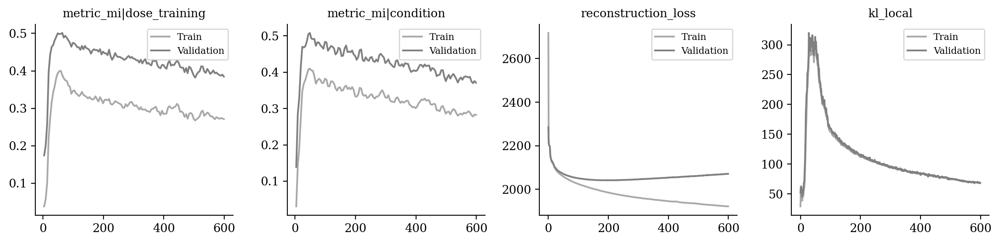

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", 
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

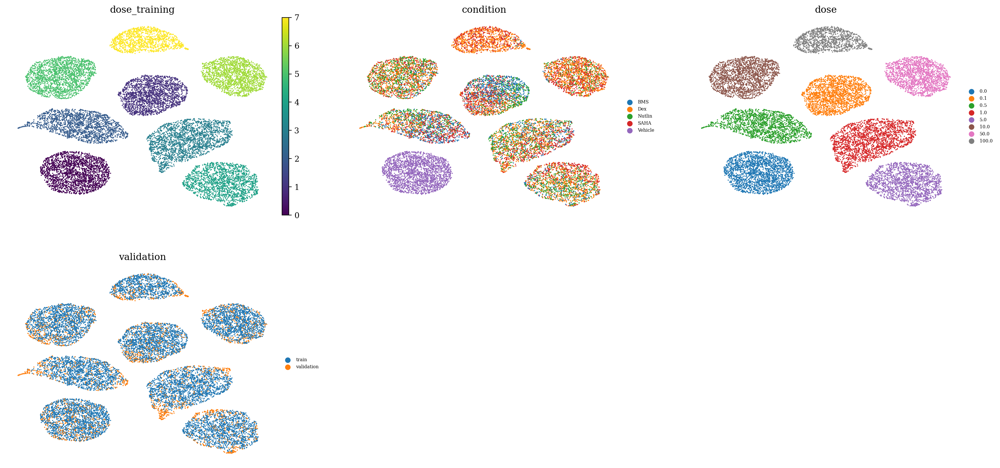

In [13]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

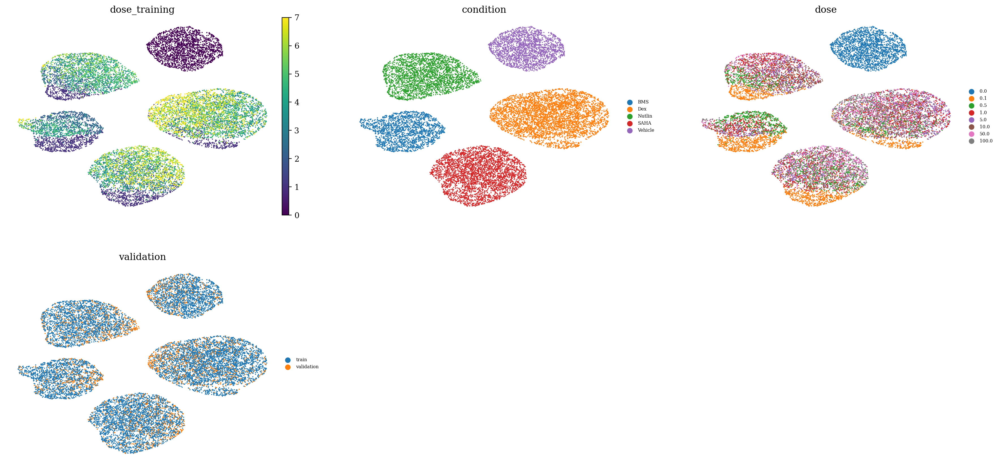

In [14]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

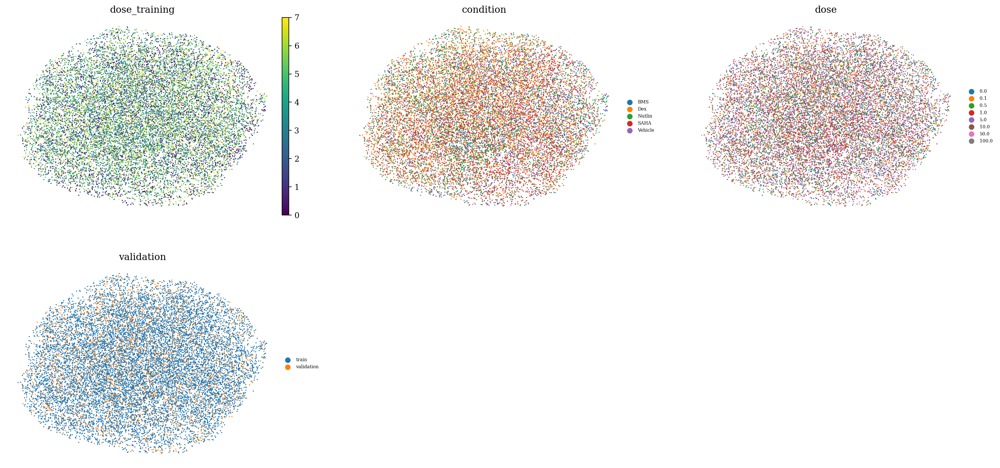

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

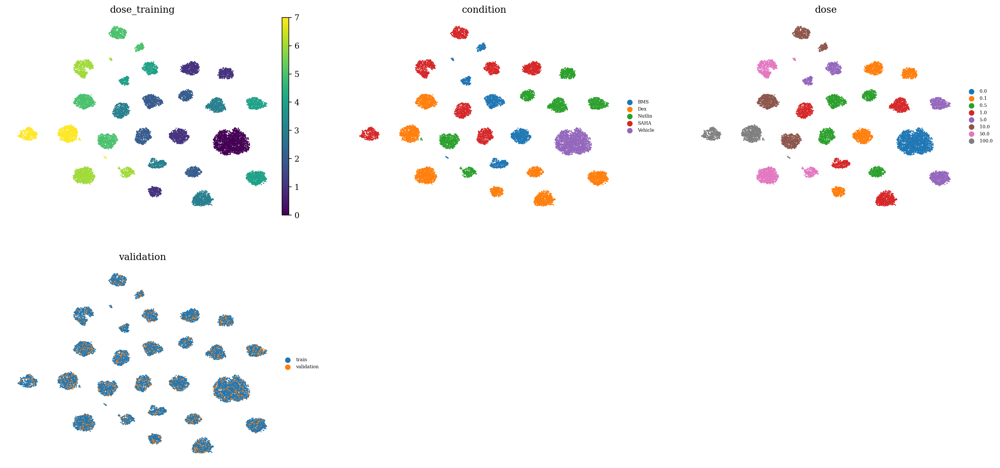

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
1

1